In [24]:
import matplotlib.font_manager
import pandas as pd 
import numpy as np
import locale
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import os 
plt.rcParams['font.family']='Hiragino Maru Gothic Pro' #'sans-serif' #
#print([f.name for f in matplotlib.font_manager.fontManager.ttflist])

In [25]:
! ls data/England

England-monthly-all-death-vax-status.csv
referencetable06072022accessible.xlsx


In [26]:
input_file = 'data/England/England-monthly-all-death-vax-status.csv'

df = pd.read_csv(input_file, header='infer',engine='python')


In [76]:
# Mapping
ful2short = {'Male':'Male' 
              ,'Female':'Female'
              ,'First dose, at least 21 days ago':'1st dose ACMR'
              ,'Second dose, at least 21 days ago':'2nd dose ACMR'
              ,'Third dose or booster, at least 21 days ago':'3rd dose ACMR'}

In [30]:
ful2short

{'Male': 'Male',
 'Female': 'Female',
 'First dose, at least 21 days ago': '1st dose ACMRT',
 'Second dose, at least 21 days ago': '2nd dose ACMRT',
 'Third dose or booster, at least 21 days ago': '3rd dose ACMRT'}

# Preprocessing

In [77]:
target = 'Count of deaths'
df.loc[df[target] == '<3',target ] = 'NaN' #'0.0001'
df['Age-standardised mortality rate / 100,000 person-years']

0         55.0
1         38.2
2            x
3            x
4            x
         ...  
3327         x
3328         x
3329    2712.1
3330         x
3331    1210.1
Name: Age-standardised mortality rate / 100,000 person-years, Length: 3332, dtype: object

In [78]:
male_df=df[df['Sex']=='Male'].reset_index(drop=True)
female_df=df[df['Sex']=='Female'].reset_index(drop=True)

In [79]:
female_df.columns.tolist()[1:8]

['Cause of Death',
 'Year',
 'Month',
 'Age group',
 'Vaccination status',
 'Count of deaths',
 'Person-years']

In [80]:
new_df = female_df[['Cause of Death', 'Year', 'Month', 'Age group', 'Vaccination status']]

new_df['Count of deaths'] = female_df['Count of deaths'].values.astype(float) + male_df['Count of deaths'].values.astype(float)

new_df['Person-years'] = female_df['Person-years'].values.astype(float) + male_df['Person-years'].values.astype(float)

new_df['Morality_rate_per100K'] = new_df['Count of deaths'].astype(float)/new_df['Person-years'].astype(float) * 100000

/var/folders/g2/q79cxj1s6d148dc_pt98ggx40000gn/T/ipykernel_53589/2682671901.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  new_df['Count of deaths'] = female_df['Count of deaths'].values.astype(float) + male_df['Count of deaths'].values.astype(float)
/var/folders/g2/q79cxj1s6d148dc_pt98ggx40000gn/T/ipykernel_53589/2682671901.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  new_df['Person-years'] = female_df['Person-years'].values.astype(float) + male_df['Person-years'].values.astype(float)
/var/fold

In [81]:
vax_status_lst = new_df['Vaccination status'].unique().tolist()

vax_status_lst

['Unvaccinated',
 'First dose, less than 21 days ago',
 'First dose, at least 21 days ago',
 'Second dose, less than 21 days ago',
 'Second dose, at least 21 days ago',
 'Third dose or booster, less than 21 days ago',
 'Third dose or booster, at least 21 days ago']

In [82]:
dict_mName2Num = {}
for num,month in enumerate(new_df['Month'].unique().tolist(),start=1):
    if num < 10:
        num = '0' + str(num)
    dict_mName2Num[month] = num
    

In [83]:
new_df['Month_str'] = new_df['Month'].apply(lambda x: dict_mName2Num[x])

/var/folders/g2/q79cxj1s6d148dc_pt98ggx40000gn/T/ipykernel_53589/3509362791.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  new_df['Month_str'] = new_df['Month'].apply(lambda x: dict_mName2Num[x])


In [84]:
new_df['Date'] = new_df['Year'].astype(str).str.cat(new_df.Month_str.astype(str),sep='-')

/var/folders/g2/q79cxj1s6d148dc_pt98ggx40000gn/T/ipykernel_53589/3475984351.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  new_df['Date'] = new_df['Year'].astype(str).str.cat(new_df.Month_str.astype(str),sep='-')


In [85]:
new_df.columns

Index(['Cause of Death', 'Year', 'Month', 'Age group', 'Vaccination status',
       'Count of deaths', 'Person-years', 'Morality_rate_per100K', 'Month_str',
       'Date'],
      dtype='object')

# Plot all-cause mortality rate for 2-dose vaccinated and unvaccinated

In [87]:
vax_status_lst = ['Unvaccinated','Second dose, at least 21 days ago']

AgeGroup_lst = new_df['Age group'].unique().tolist()

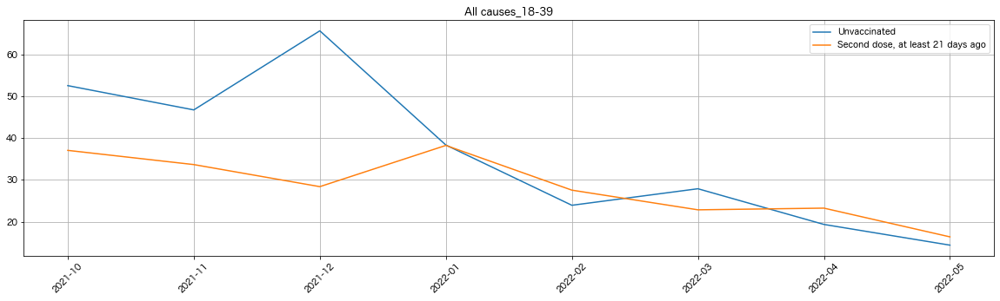

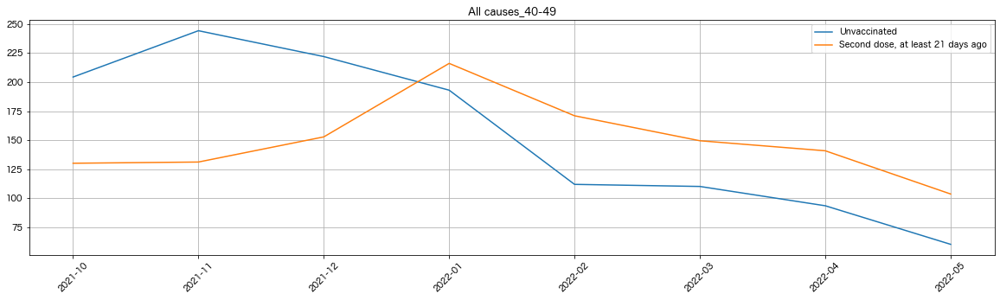

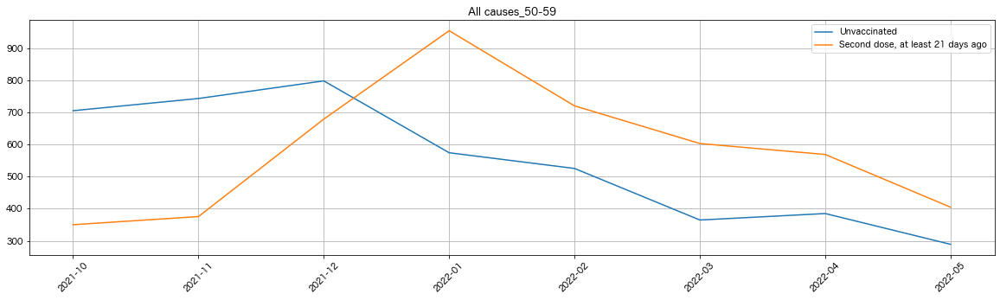

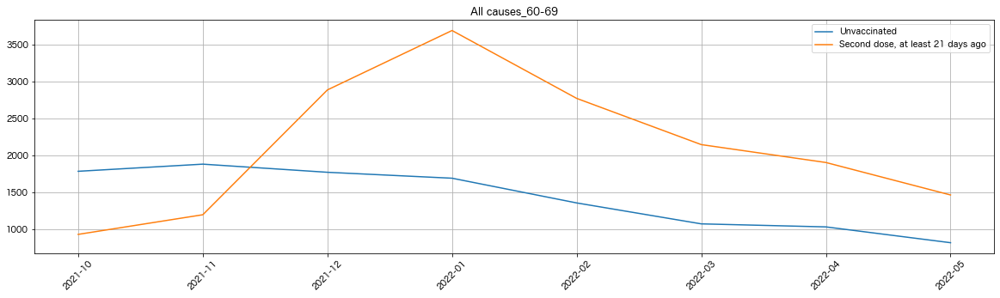

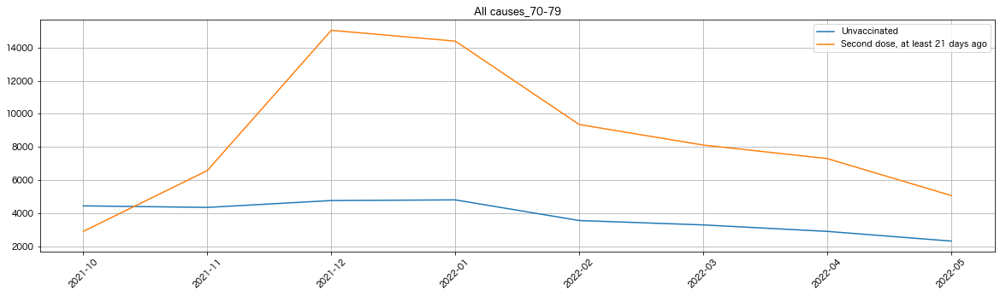

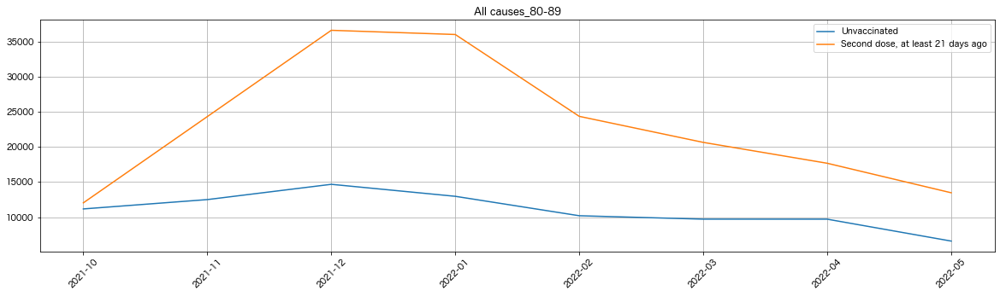

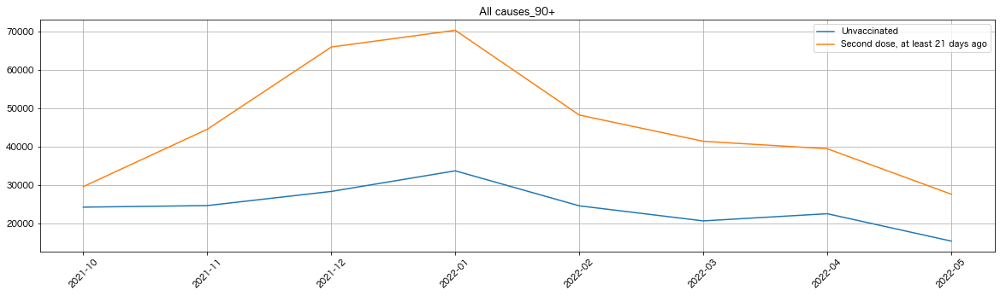

In [88]:
#for sex in ['Male','Female']:
for AgeGroup in AgeGroup_lst:
    for CauseOfDeath in ['All causes']:
        select_df = new_df[(new_df['Age group']==AgeGroup) & (new_df['Cause of Death']==CauseOfDeath)& (new_df['Date'] > '2021-09')]
        fig,ax=plt.subplots()
        for v_status in vax_status_lst:
            plt_df = select_df[select_df['Vaccination status'] == v_status][['Date','Morality_rate_per100K']].reset_index(drop=True)
            plt.plot(plt_df['Date'],plt_df['Morality_rate_per100K'])
        ax.tick_params(axis='x', labelrotation=45)
        fig.set_size_inches(20, 5)
        ax.legend(vax_status_lst)
        plt.title('_'.join([CauseOfDeath,AgeGroup]))
        plt.grid()

# All-cause mortality relative risk, xdose/unvax 

### 1dose

[Vax status:  First dose, at least 21 days ago ]
18-39 3.0315608907300833 12 1.7896401216340223 17 1.5301492150366007
40-49 3.43001780441202 12 2.249796594748099 17 1.8411599151940636
50-59 2.7132897603485837 12 2.0938149064602336 17 1.6551042320285116
60-69 3.9241785469983386 12 2.710074745649681 17 2.067068144051355
70-79 5.810994482950216 14 3.064722570515701 17 2.5689406140503293
80-89 4.459785771778837 14 2.6412520999663696 17 2.221319493407402
90+ 3.223194977925654 14 2.1098505111887906 17 1.8080370217547796
Average is:  2.2374102621592433


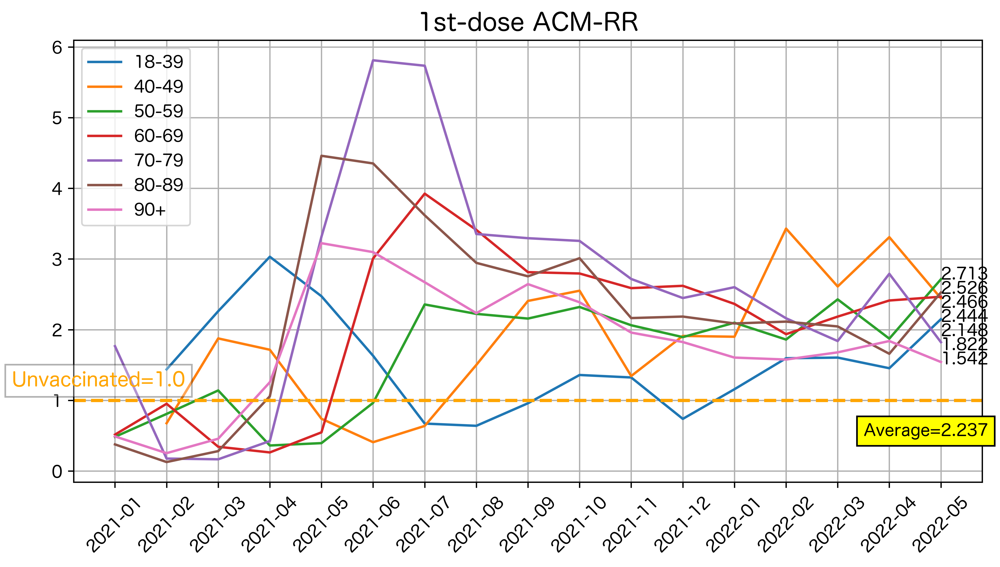

In [89]:
v_status = 'First dose, at least 21 days ago'
print('[Vax status: ', v_status, ']')
fig_size = (10,5)
save_path = 'results/England_Death_EN202205/all_cause_1dose/'
os.makedirs(save_path,exist_ok=True)

last_month = new_df['Date'].unique().tolist()[-1]
annot_lst = []
pos_lst = []

#for sex in ['Male','Female']:
for CauseOfDeath in ['All causes']:
    fig,ax=plt.subplots()
    for AgeGroup in AgeGroup_lst:
        #select_df = df[(df['Sex']==sex) & (df['Age group']==AgeGroup) & (df['Cause of Death']==CauseOfDeath)] #& (df['Date'] > '2021-09')]
        select_df = new_df[(new_df['Age group']==AgeGroup) & (new_df['Cause of Death']==CauseOfDeath)] #& (df['Date'] > '2021-07')]
        risk_lst = select_df[select_df['Vaccination status']==v_status]['Morality_rate_per100K'].reset_index(drop=True) / select_df[select_df['Vaccination status']=='Unvaccinated']['Morality_rate_per100K'].reset_index(drop=True)
        plt_df = select_df[select_df['Vaccination status'] == 'Unvaccinated'][['Date']].reset_index(drop=True) #,'Morality_rate_per100K']].reset_index(drop=True)
        plt_df['xdose/unvax'] = risk_lst
        plt.plot(plt_df['Date'],plt_df['xdose/unvax'])
        ax.tick_params(axis='x', labelrotation=45)
        fig.set_size_inches(fig_size)
        fig.set_dpi(600)
        ax.legend(AgeGroup_lst,loc='upper left')
        idx=plt_df[plt_df['Date']==last_month].index[0]
        annot_lst.append(plt_df.iloc[idx]['xdose/unvax'])
        #print(AgeGroup,risk_lst.max(),risk_lst.mean())
        print(AgeGroup,risk_lst.max(),len(risk_lst[risk_lst>1].tolist()),risk_lst[risk_lst>1].mean(),len(risk_lst),risk_lst.mean()) #,risk_lst[risk_lst>1].tolist()
    annot_lst.sort(reverse=True)
    for i in range(len(annot_lst)):
        if i > 0:
            if abs(annot_lst[i] - pos_lst[i-1]) < 0.2:
                pos_lst.append(pos_lst[i-1] - 0.2)
            else:
                pos_lst.append(annot_lst[i])
        else:
            pos_lst.append(annot_lst[i])
    for i in range(len(annot_lst)):
        ax.text(idx,pos_lst[i],"{:.3f}".format(annot_lst[i]),color="black")
    ax.text(-2,1.2,'Unvaccinated=1.0',color="orange",fontsize=12,bbox=dict(facecolor='white', edgecolor=None, alpha=0.3))
    plt.axhline(y=1.0, color="orange", linestyle="--",linewidth = 2)
    ax.text(idx-1.5,0.5,"Average={:.3f}".format(sum(annot_lst)/len(annot_lst)),color="black",bbox=dict(facecolor='yellow', edgecolor=None, alpha=1))
    
    plt.title(''.join('1st-dose ACM-RR'),fontsize=15) #[CauseOfDeath,sex,v_status]
    plt.grid()
    fig.savefig(' '.join([save_path,'【All causes mortality risk, 1st dose】',ful2short[v_status],'VS Unvaccinated'])+str(fig_size)+'.png',facecolor='white', transparent=False)

print('Average is: ',sum(annot_lst)/len(annot_lst))

In [90]:
!ls results/England_Death_EN202205/all_cause_1dose/*

results/England_Death_EN202205/all_cause_1dose/ 【All causes mortality risk, 1st dose】 1st dose ACMR VS Unvaccinated(10, 5).png


### 2doses

[Vax status:  Second dose, at least 21 days ago ]
18-39 1.9155764790128413 6 1.4366175559947738 17 1.0804926155478352
40-49 1.7207462129767566 5 1.4468112142009646 17 0.9184026869441585
50-59 1.6614622760534952 5 1.51232202210327 17 0.8493286075601925
60-69 2.184770776120142 6 1.9175346366839545 17 1.0155584685703536
70-79 3.161413998055695 7 2.49770488135952 17 1.3136849721533213
80-89 2.778505897771953 8 2.084939740622624 17 1.1747906060286977
90+ 2.3266970655902455 8 1.8682822146743019 17 1.1593585319864914
Average is:  1.725730480477076


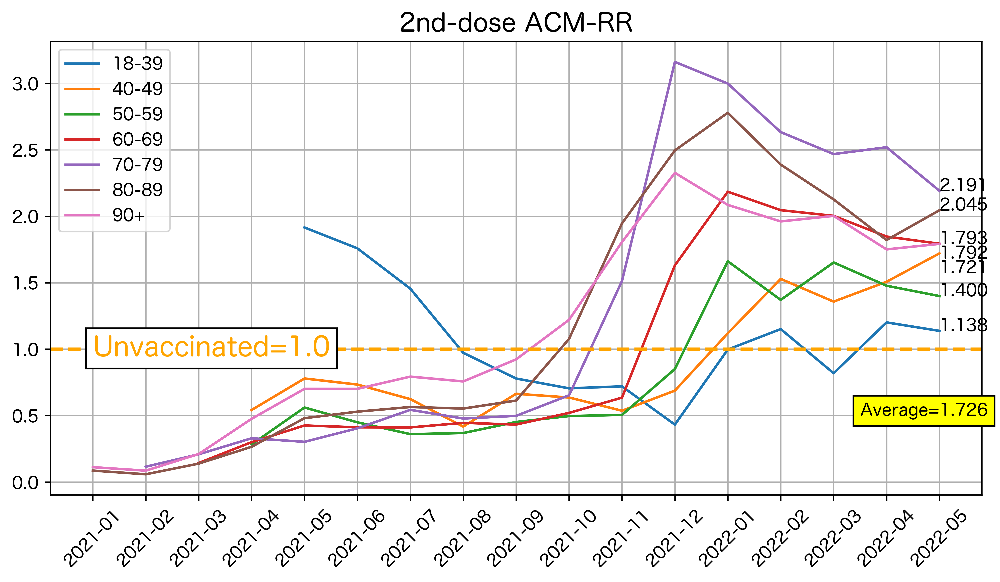

In [91]:
v_status = 'Second dose, at least 21 days ago'
print('[Vax status: ', v_status, ']')
fig_size = (10,5)
save_path = 'results/England_Death_EN202205/all_cause_2dose/'
os.makedirs(save_path,exist_ok=True)

last_month = new_df['Date'].unique().tolist()[-1]
annot_lst = []
pos_lst = []
#for sex in ['Male','Female']:
for CauseOfDeath in ['All causes']:
    fig,ax=plt.subplots()
    for AgeGroup in AgeGroup_lst:
        #select_df = df[(df['Sex']==sex) & (df['Age group']==AgeGroup) & (df['Cause of Death']==CauseOfDeath)] #& (df['Date'] > '2021-09')]
        select_df = new_df[(new_df['Age group']==AgeGroup) & (new_df['Cause of Death']==CauseOfDeath)] #& (df['Date'] > '2021-07')]
        risk_lst = select_df[select_df['Vaccination status']==v_status]['Morality_rate_per100K'].reset_index(drop=True) / select_df[select_df['Vaccination status']=='Unvaccinated']['Morality_rate_per100K'].reset_index(drop=True)
        plt_df = select_df[select_df['Vaccination status'] == 'Unvaccinated'][['Date']].reset_index(drop=True) #,'Morality_rate_per100K']].reset_index(drop=True)
        plt_df['xdose/unvax'] = risk_lst
        plt.plot(plt_df['Date'],plt_df['xdose/unvax'])
        ax.tick_params(axis='x', labelrotation=45)
        fig.set_size_inches(fig_size)
        fig.set_dpi(600)
        ax.legend(AgeGroup_lst,loc='upper left')
        idx=plt_df[plt_df['Date']==last_month].index[0]
        annot_lst.append(plt_df.iloc[idx]['xdose/unvax'])
        #print(AgeGroup,risk_lst.max(),risk_lst.mean())
        print(AgeGroup,risk_lst.max(),len(risk_lst[risk_lst>1].tolist()),risk_lst[risk_lst>1].mean(),len(risk_lst),risk_lst.mean()) #,risk_lst[risk_lst>1].tolist()
    annot_lst.sort(reverse=True)
    for i in range(len(annot_lst)):
        if i > 0:
            if abs(annot_lst[i] - pos_lst[i-1]) < 0.11:
                pos_lst.append(pos_lst[i-1] - 0.11)
            else:
                pos_lst.append(annot_lst[i])
        else:
            pos_lst.append(annot_lst[i])
    for i in range(len(annot_lst)):
        ax.text(idx,pos_lst[i],"{:.3f}".format(annot_lst[i]),color="black")
    ax.text(0,0.95,'Unvaccinated=1.0',color="orange",fontsize=16,bbox=dict(facecolor='white', edgecolor=None, alpha=1))
    plt.axhline(y=1.0, color="orange", linestyle="--",linewidth = 2)
    ax.text(idx-1.5,0.5,"Average={:.3f}".format(sum(annot_lst)/len(annot_lst)),color="black",bbox=dict(facecolor='yellow', edgecolor=None, alpha=1))
    #plt.title(''.join(['【All-Causes Mortality Risk, 2nd dose】','({})'.format(EN2CN[v_status]+'/ Unvaccinated ACMRT')]),fontsize=15) #[CauseOfDeath,sex,v_status]
    plt.title(''.join('2nd-dose ACM-RR'),fontsize=15) #[CauseOfDeath,sex,v_status]
    #plt.title(''.join(['【2nd dose ACMRK】','({})'.format(EN2CN[v_status]+' / Unvaccinated ACMRT')]),fontsize=15) #[CauseOfDeath,sex,v_status]
    #plt.title(''.join(['All-Causes Mortality Risk, 2nd dose']),fontsize=15) #[CauseOfDeath,sex,v_status]
    plt.grid()
    fig.savefig(' '.join([save_path,'【All causes mortality risk, 2nd dose】',ful2short[v_status],'VS Unvaccinated'])+str(fig_size)+'.png',facecolor='white', transparent=False)

print('Average is: ',sum(annot_lst)/len(annot_lst))

In [92]:
!ls results/England_Death_EN202205/all_cause_2dose/*

results/England_Death_EN202205/all_cause_2dose/ 【All causes mortality risk, 2nd dose】 2nd dose ACMR VS Unvaccinated(10, 5).png


### 3doses

[Vax status:  Third dose or booster, at least 21 days ago ]
18-39 1.5472903313143727 1.2063176762287502
40-49 1.404112776499143 0.8771298802805719
50-59 0.8300168944847404 0.5217522800473647
60-69 0.7881375236051817 0.516975979566082
70-79 0.7911948730390257 0.5283272354738993
80-89 0.9329308743439434 0.5875177622957387
90+ 1.133375502006145 0.818695895762387
Average is:  1.0610083964703647


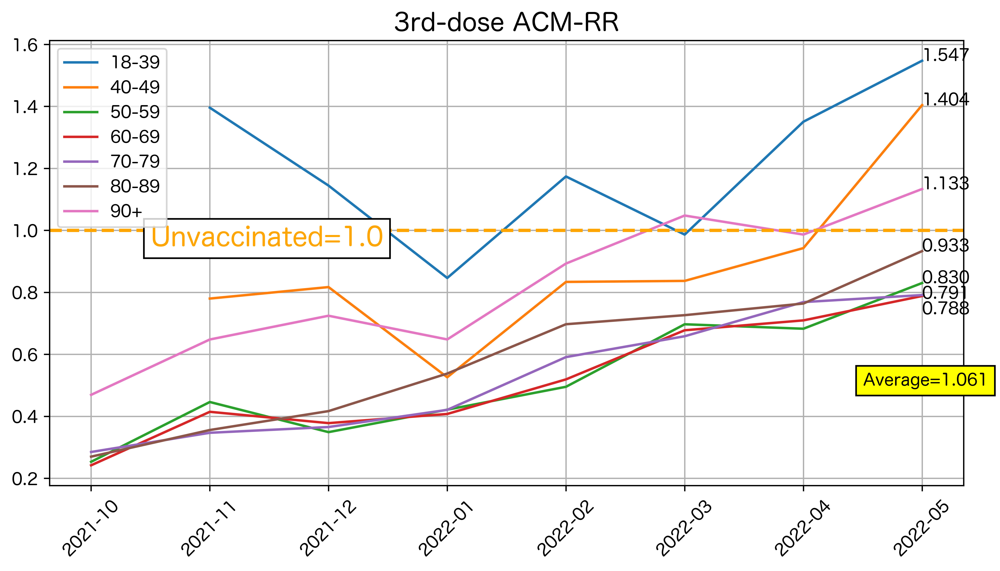

In [93]:
v_status = 'Third dose or booster, at least 21 days ago'
print('[Vax status: ', v_status, ']')
fig_size = (10,5)
save_path = 'results/England_Death_EN202205/all_cause_3dose/'
os.makedirs(save_path,exist_ok=True)

last_month = new_df['Date'].unique().tolist()[-1]
annot_lst = []
pos_lst = []

#for sex in ['Male','Female']:
for CauseOfDeath in ['All causes']:
    fig,ax=plt.subplots()
    for AgeGroup in AgeGroup_lst:
        #select_df = df[(df['Sex']==sex) & (df['Age group']==AgeGroup) & (df['Cause of Death']==CauseOfDeath)] #& (df['Date'] > '2021-09')]
        select_df = new_df[(new_df['Age group']==AgeGroup) & (new_df['Cause of Death']==CauseOfDeath) & (new_df['Date'] > '2021-07')]
        risk_lst = select_df[select_df['Vaccination status']==v_status]['Morality_rate_per100K'].reset_index(drop=True) / select_df[select_df['Vaccination status']=='Unvaccinated']['Morality_rate_per100K'].reset_index(drop=True)
        plt_df = select_df[select_df['Vaccination status'] == 'Unvaccinated'][['Date']].reset_index(drop=True) #,'Morality_rate_per100K']].reset_index(drop=True)
        plt_df['xdose/unvax'] = risk_lst
        plt.plot(plt_df['Date'],plt_df['xdose/unvax'])
        ax.tick_params(axis='x', labelrotation=45)
        fig.set_size_inches(fig_size)
        fig.set_dpi(600)
        ax.legend(AgeGroup_lst,loc='upper left')
        idx=plt_df[plt_df['Date']==last_month].index[0]
        annot_lst.append(plt_df.iloc[idx]['xdose/unvax'])
        print(AgeGroup,risk_lst.max(),risk_lst.mean())
        
    annot_lst.sort(reverse=True)
    for i in range(len(annot_lst)):
        if i > 0:
            if abs(annot_lst[i] - pos_lst[i-1]) < 0.05:
                pos_lst.append(pos_lst[i-1] - 0.05)
            else:
                pos_lst.append(annot_lst[i])
        else:
            pos_lst.append(annot_lst[i])
    for i in range(len(annot_lst)):
        ax.text(idx,pos_lst[i],"{:.3f}".format(annot_lst[i]),color="black")    
    ax.text(2.5,0.95,'Unvaccinated=1.0',color="orange",fontsize=16,bbox=dict(facecolor='white', edgecolor=None, alpha=1))
    plt.axhline(y=1.0, color="orange", linestyle="--",linewidth = 2)
    ax.text(idx-0.5,0.5,"Average={:.3f}".format(sum(annot_lst)/len(annot_lst)),color="black",bbox=dict(facecolor='yellow', edgecolor=None, alpha=1))

    plt.title(''.join('3rd-dose ACM-RR'),fontsize=15) #[CauseOfDeath,sex,v_status]
    plt.grid()
    fig.savefig(' '.join([save_path,'【All causes mortality risk, 3rd dose】',ful2short[v_status],'VS Unvaccinated'])+str(fig_size)+'.png',facecolor='white', transparent=False)

print('Average is: ',sum(annot_lst)/len(annot_lst))

In [94]:
!ls results/England_Death_EN202205/all_cause_3dose/*

results/England_Death_EN202205/all_cause_3dose/ 【All causes mortality risk, 3rd dose】 3rd dose ACMR VS Unvaccinated(10, 5).png


# Deaths involving COVID-19,   1st dose

[Vax status:  First dose, at least 21 days ago ]


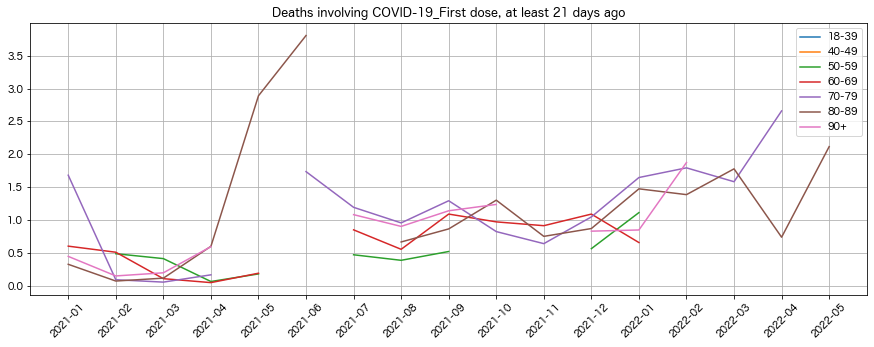

In [95]:
AgeGroup_lst = ['18-39', '40-49', '50-59', '60-69','70-79', '80-89', '90+'] # 

v_status = 'First dose, at least 21 days ago'
print('[Vax status: ', v_status, ']')
for CauseOfDeath in ['Deaths involving COVID-19']:
    fig,ax=plt.subplots()
    for AgeGroup in AgeGroup_lst:
        #select_df = df[(df['Sex']==sex) & (df['Age group']==AgeGroup) & (df['Cause of Death']==CauseOfDeath)] #& (df['Date'] > '2021-09')]
        #select_df = df[(df['Sex']==sex) & (df['Age group']==AgeGroup) & (df['Cause of Death']==CauseOfDeath)] # & (df['Date'] > '2021-07')]
        select_df = new_df[(new_df['Age group']==AgeGroup) & (new_df['Cause of Death']==CauseOfDeath)] # & (new_df['Date'] > '2021-07')]
        risk_lst = select_df[select_df['Vaccination status']==v_status]['Morality_rate_per100K'].reset_index(drop=True) / select_df[select_df['Vaccination status']=='Unvaccinated']['Morality_rate_per100K'].reset_index(drop=True)
        plt_df = select_df[select_df['Vaccination status'] == 'Unvaccinated'][['Date']].reset_index(drop=True) #,'Morality_rate_per100K']].reset_index(drop=True)
        plt_df['xdose/unvax'] = risk_lst
        plt.plot(plt_df['Date'],plt_df['xdose/unvax'])
        ax.tick_params(axis='x', labelrotation=45)
        fig.set_size_inches(15, 5)
        ax.legend(AgeGroup_lst)
        plt.title('_'.join([CauseOfDeath,v_status]))
    plt.grid()
#AgeGroup_lst = ['18-39', '40-49', '50-59', '60-69', '70-79', '80-89', '90+']

# Deaths involving COVID-19,   2nd dose

[Vax status:  Second dose, at least 21 days ago ]


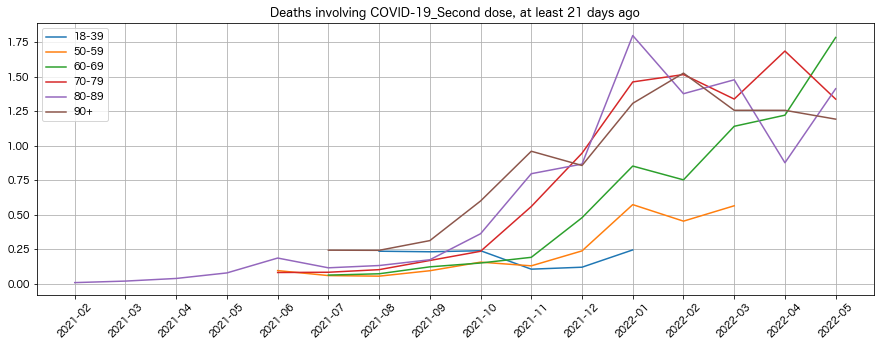

In [96]:
AgeGroup_lst = ['18-39', '50-59', '60-69', '70-79', '80-89', '90+']

v_status = 'Second dose, at least 21 days ago'
print('[Vax status: ', v_status, ']')

for CauseOfDeath in ['Deaths involving COVID-19']:
    fig,ax=plt.subplots()
    for AgeGroup in AgeGroup_lst:
        #select_df = df[(df['Sex']==sex) & (df['Age group']==AgeGroup) & (df['Cause of Death']==CauseOfDeath)] #& (df['Date'] > '2021-09')]
        #select_df = df[(df['Sex']==sex) & (df['Age group']==AgeGroup) & (df['Cause of Death']==CauseOfDeath)] # & (df['Date'] > '2021-07')]
        select_df = new_df[(new_df['Age group']==AgeGroup) & (new_df['Cause of Death']==CauseOfDeath)] # & (new_df['Date'] > '2021-07')]
        risk_lst = select_df[select_df['Vaccination status']==v_status]['Morality_rate_per100K'].reset_index(drop=True) / select_df[select_df['Vaccination status']=='Unvaccinated']['Morality_rate_per100K'].reset_index(drop=True)
        plt_df = select_df[select_df['Vaccination status'] == 'Unvaccinated'][['Date']].reset_index(drop=True) #,'Morality_rate_per100K']].reset_index(drop=True)
        plt_df['xdose/unvax'] = risk_lst
        plt.plot(plt_df['Date'],plt_df['xdose/unvax'])
        ax.tick_params(axis='x', labelrotation=45)
        fig.set_size_inches(15, 5)
        ax.legend(AgeGroup_lst)
        plt.title('_'.join([CauseOfDeath,v_status]))
    plt.grid()

AgeGroup_lst = ['18-39', '40-49', '50-59', '60-69', '70-79', '80-89', '90+']

# Deaths involving COVID-19,      3rd dose

[Vax status:  Third dose or booster, at least 21 days ago ]


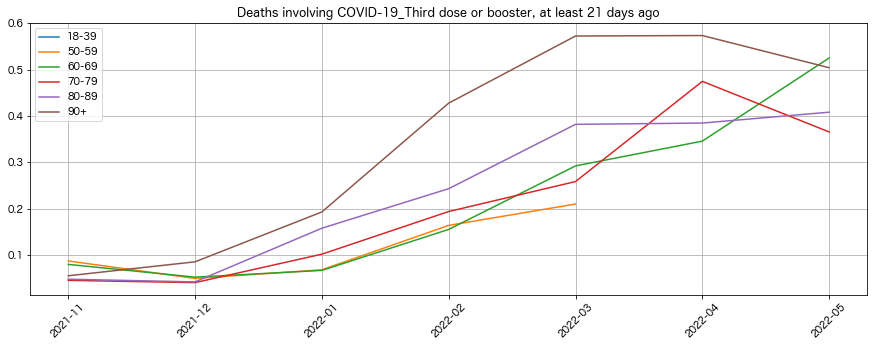

In [97]:
AgeGroup_lst = ['18-39', '50-59', '60-69', '70-79', '80-89', '90+']

v_status = 'Third dose or booster, at least 21 days ago'
print('[Vax status: ', v_status, ']')

for CauseOfDeath in ['Deaths involving COVID-19']:
    fig,ax=plt.subplots()
    for AgeGroup in AgeGroup_lst:
        #select_df = df[(df['Sex']==sex) & (df['Age group']==AgeGroup) & (df['Cause of Death']==CauseOfDeath)] #& (df['Date'] > '2021-09')]
        #select_df = df[(df['Sex']==sex) & (df['Age group']==AgeGroup) & (df['Cause of Death']==CauseOfDeath)] # & (df['Date'] > '2021-07')]
        select_df = new_df[(new_df['Age group']==AgeGroup) & (new_df['Cause of Death']==CauseOfDeath)] # & (new_df['Date'] > '2021-07')]
        risk_lst = select_df[select_df['Vaccination status']==v_status]['Morality_rate_per100K'].reset_index(drop=True) / select_df[select_df['Vaccination status']=='Unvaccinated']['Morality_rate_per100K'].reset_index(drop=True)
        plt_df = select_df[select_df['Vaccination status'] == 'Unvaccinated'][['Date']].reset_index(drop=True) #,'Morality_rate_per100K']].reset_index(drop=True)
        plt_df['xdose/unvax'] = risk_lst
        plt.plot(plt_df['Date'],plt_df['xdose/unvax'])
        ax.tick_params(axis='x', labelrotation=45)
        fig.set_size_inches(15, 5)
        ax.legend(AgeGroup_lst)
        plt.title('_'.join([CauseOfDeath,v_status]))
    plt.grid()
AgeGroup_lst = ['18-39', '40-49', '50-59', '60-69', '70-79', '80-89', '90+']

# non-covid death,  1st dose

[Vax status:  First dose, at least 21 days ago ]


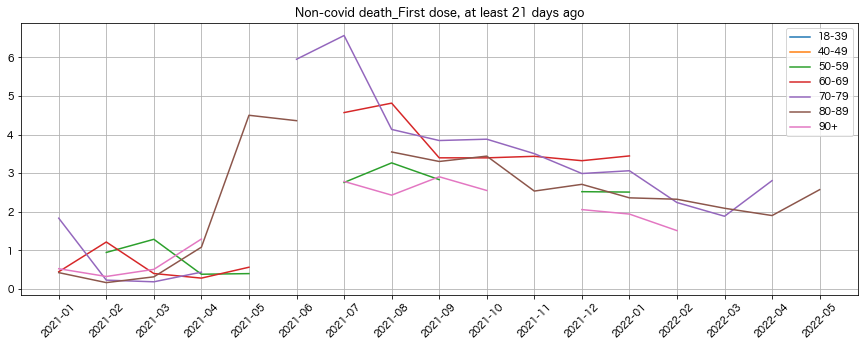

In [98]:
AgeGroup_lst = ['18-39', '40-49', '50-59', '60-69', '70-79', '80-89', '90+']
import copy
CauseOfDeath='Non-covid death'
v_status = 'First dose, at least 21 days ago'
print('[Vax status: ', v_status, ']')

#for sex in ['Male','Female']:
fig,ax=plt.subplots()
for AgeGroup in AgeGroup_lst:
    #select_df = df[(df['Sex']==sex) & (df['Age group']==AgeGroup) & (df['Cause of Death']==CauseOfDeath)] #& (df['Date'] > '2021-09')]
    #select_df0 = df[(df['Sex']==sex) & (df['Age group']==AgeGroup) & (df['Cause of Death']=='All causes')].reset_index(drop=True) # & (df['Date'] > '2021-07')
    #select_df1 = df[(df['Sex']==sex) & (df['Age group']==AgeGroup) & (df['Cause of Death']=='Deaths involving COVID-19')].reset_index(drop=True) #  & (df['Date'] > '2021-07')
    
    select_df0 = new_df[(new_df['Age group']==AgeGroup) & (new_df['Cause of Death']=='All causes')].reset_index(drop=True) # & (df['Date'] > '2021-07')
    select_df1 = new_df[(new_df['Age group']==AgeGroup) & (new_df['Cause of Death']=='Deaths involving COVID-19')].reset_index(drop=True) #  & (df['Date'] > '2021-07')
    
    select_df = copy.deepcopy(select_df0)
    select_df['Morality_rate_per100K'] = select_df0['Morality_rate_per100K'] - select_df1['Morality_rate_per100K']
    #for v_status in vax_status_lst:
    risk_lst = select_df[select_df['Vaccination status']==v_status]['Morality_rate_per100K'].reset_index(drop=True) / select_df[select_df['Vaccination status']=='Unvaccinated']['Morality_rate_per100K'].reset_index(drop=True)
    plt_df = select_df[select_df['Vaccination status'] == 'Unvaccinated'][['Date']].reset_index(drop=True) #,'Morality_rate_per100K']].reset_index(drop=True)
    plt_df['xdose/unvax'] = risk_lst
    plt.plot(plt_df['Date'],plt_df['xdose/unvax'])
    ax.tick_params(axis='x', labelrotation=45)
    fig.set_size_inches(15, 5)
    ax.legend(AgeGroup_lst)
    plt.title('_'.join([CauseOfDeath,v_status]))
plt.grid()

AgeGroup_lst = ['18-39', '40-49', '50-59', '60-69', '70-79', '80-89', '90+']

# non-covid death,  2nd dose

[Vax status:  Second dose, at least 21 days ago ]


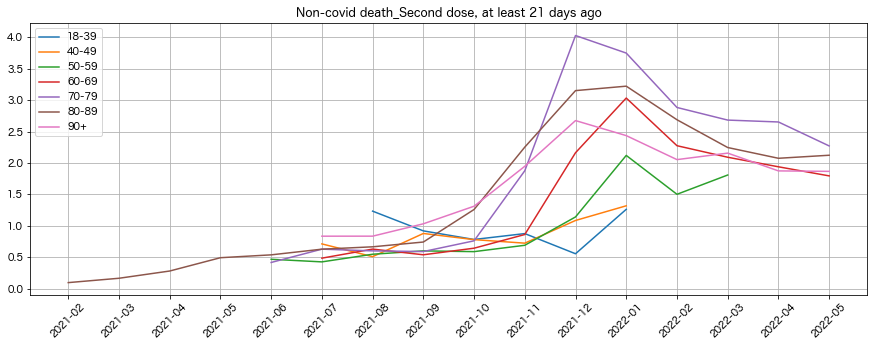

In [99]:
AgeGroup_lst = ['18-39', '40-49', '50-59', '60-69', '70-79', '80-89', '90+']
import copy
CauseOfDeath='Non-covid death'
v_status = 'Second dose, at least 21 days ago'
print('[Vax status: ', v_status, ']')

fig,ax=plt.subplots()
for AgeGroup in AgeGroup_lst:
    #select_df = df[(df['Sex']==sex) & (df['Age group']==AgeGroup) & (df['Cause of Death']==CauseOfDeath)] #& (df['Date'] > '2021-09')]
    #select_df0 = df[(df['Sex']==sex) & (df['Age group']==AgeGroup) & (df['Cause of Death']=='All causes')].reset_index(drop=True) # & (df['Date'] > '2021-07')
    #select_df1 = df[(df['Sex']==sex) & (df['Age group']==AgeGroup) & (df['Cause of Death']=='Deaths involving COVID-19')].reset_index(drop=True) #  & (df['Date'] > '2021-07')
    
    select_df0 = new_df[(new_df['Age group']==AgeGroup) & (new_df['Cause of Death']=='All causes')].reset_index(drop=True) # & (df['Date'] > '2021-07')
    select_df1 = new_df[(new_df['Age group']==AgeGroup) & (new_df['Cause of Death']=='Deaths involving COVID-19')].reset_index(drop=True) #  & (df['Date'] > '2021-07')
    
    select_df = copy.deepcopy(select_df0)
    select_df['Morality_rate_per100K'] = select_df0['Morality_rate_per100K'] - select_df1['Morality_rate_per100K']
    #for v_status in vax_status_lst:
    risk_lst = select_df[select_df['Vaccination status']==v_status]['Morality_rate_per100K'].reset_index(drop=True) / select_df[select_df['Vaccination status']=='Unvaccinated']['Morality_rate_per100K'].reset_index(drop=True)
    plt_df = select_df[select_df['Vaccination status'] == 'Unvaccinated'][['Date']].reset_index(drop=True) #,'Morality_rate_per100K']].reset_index(drop=True)
    plt_df['xdose/unvax'] = risk_lst
    plt.plot(plt_df['Date'],plt_df['xdose/unvax'])
    ax.tick_params(axis='x', labelrotation=45)
    fig.set_size_inches(15, 5)
    ax.legend(AgeGroup_lst)
    plt.title('_'.join([CauseOfDeath,v_status]))
plt.grid()



AgeGroup_lst = ['18-39', '40-49', '50-59', '60-69', '70-79', '80-89', '90+']

# non-covid death,   3rd dose

[Vax status:  Third dose or booster, at least 21 days ago ]


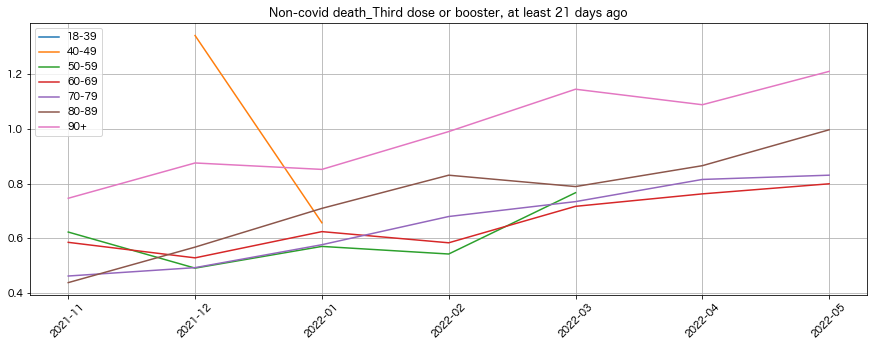

In [100]:
AgeGroup_lst = ['18-39', '40-49', '50-59', '60-69', '70-79', '80-89', '90+']
import copy
CauseOfDeath='Non-covid death'
v_status = 'Third dose or booster, at least 21 days ago'
print('[Vax status: ', v_status, ']')

fig,ax=plt.subplots()
for AgeGroup in AgeGroup_lst:
    #select_df = df[(df['Sex']==sex) & (df['Age group']==AgeGroup) & (df['Cause of Death']==CauseOfDeath)] #& (df['Date'] > '2021-09')]
    #select_df0 = df[(df['Sex']==sex) & (df['Age group']==AgeGroup) & (df['Cause of Death']=='All causes')].reset_index(drop=True) # & (df['Date'] > '2021-07')
    #select_df1 = df[(df['Sex']==sex) & (df['Age group']==AgeGroup) & (df['Cause of Death']=='Deaths involving COVID-19')].reset_index(drop=True) #  & (df['Date'] > '2021-07')
    
    select_df0 = new_df[(new_df['Age group']==AgeGroup) & (new_df['Cause of Death']=='All causes')].reset_index(drop=True) # & (df['Date'] > '2021-07')
    select_df1 = new_df[(new_df['Age group']==AgeGroup) & (new_df['Cause of Death']=='Deaths involving COVID-19')].reset_index(drop=True) #  & (df['Date'] > '2021-07')
    
    select_df = copy.deepcopy(select_df0)
    select_df['Morality_rate_per100K'] = select_df0['Morality_rate_per100K'] - select_df1['Morality_rate_per100K']
    #for v_status in vax_status_lst:
    risk_lst = select_df[select_df['Vaccination status']==v_status]['Morality_rate_per100K'].reset_index(drop=True) / select_df[select_df['Vaccination status']=='Unvaccinated']['Morality_rate_per100K'].reset_index(drop=True)
    plt_df = select_df[select_df['Vaccination status'] == 'Unvaccinated'][['Date']].reset_index(drop=True) #,'Morality_rate_per100K']].reset_index(drop=True)
    plt_df['xdose/unvax'] = risk_lst
    plt.plot(plt_df['Date'],plt_df['xdose/unvax'])
    ax.tick_params(axis='x', labelrotation=45)
    fig.set_size_inches(15, 5)
    ax.legend(AgeGroup_lst)
    plt.title('_'.join([CauseOfDeath,v_status]))
plt.grid()


AgeGroup_lst = ['18-39', '40-49', '50-59', '60-69', '70-79', '80-89', '90+']

# Same Age diff causes, 1dose

In [101]:
!ls results/England_Death_EN202205/3-causes-1doses

ls: results/England_Death_EN202205/3-causes-1doses: No such file or directory


[Vax status:  First dose, at least 21 days ago ]


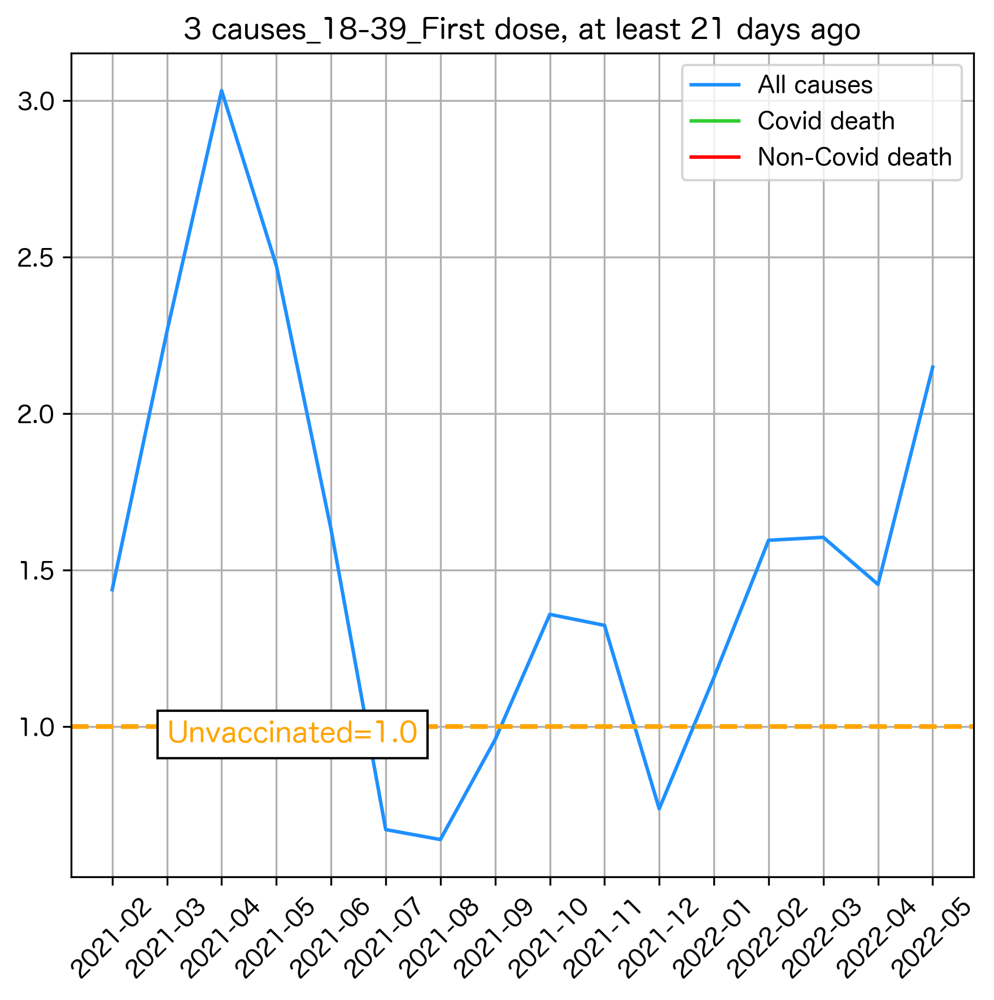

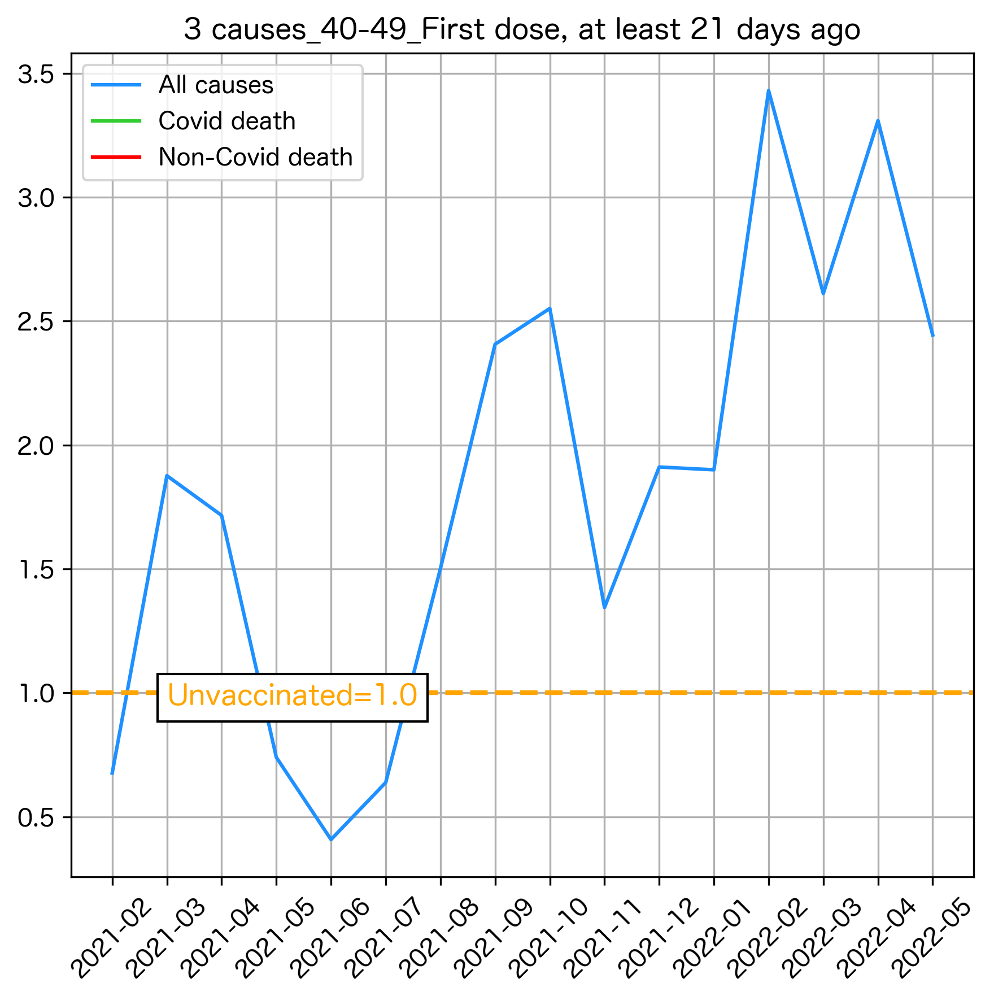

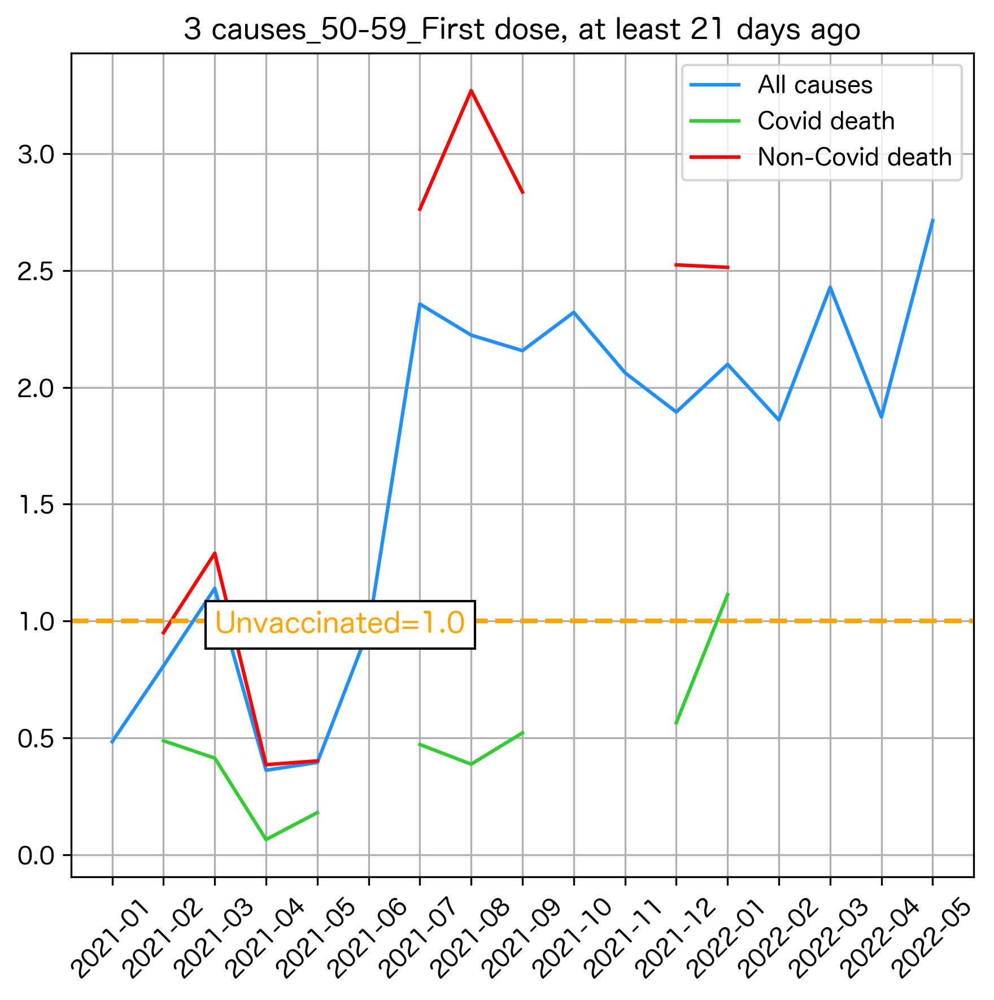

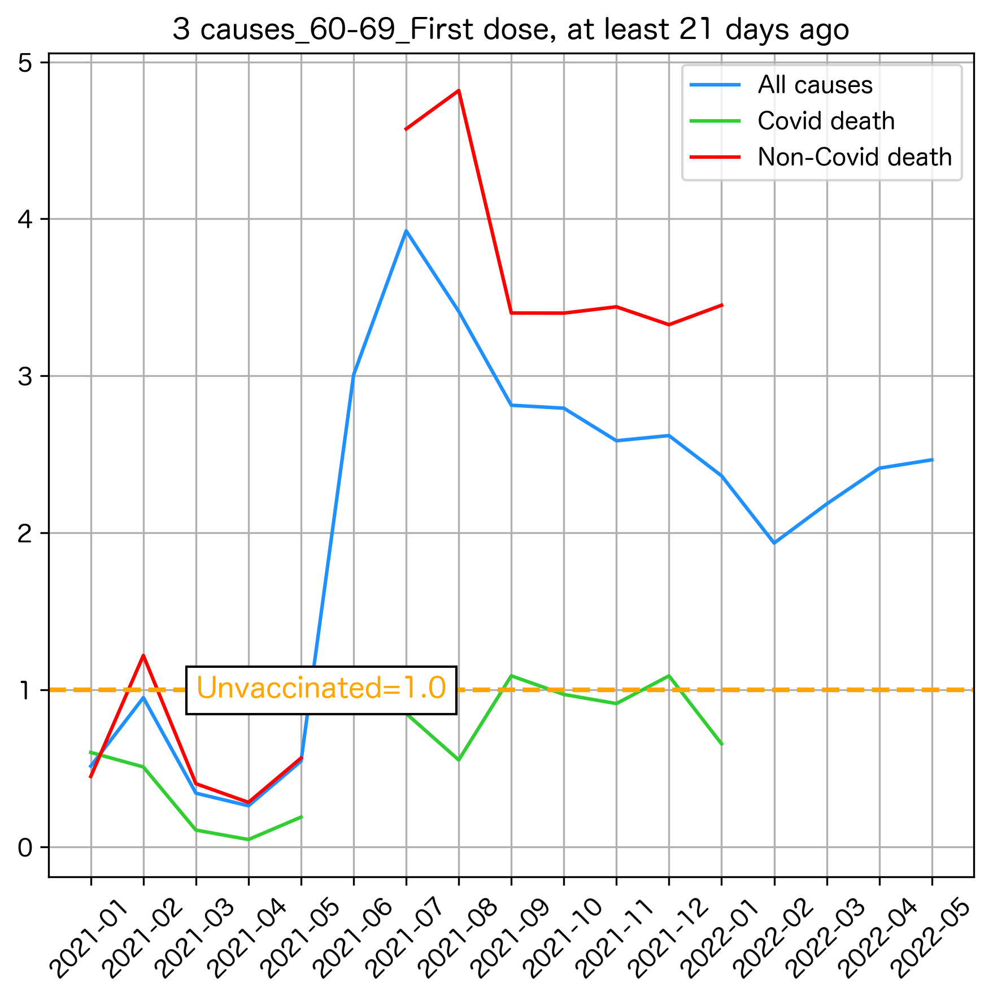

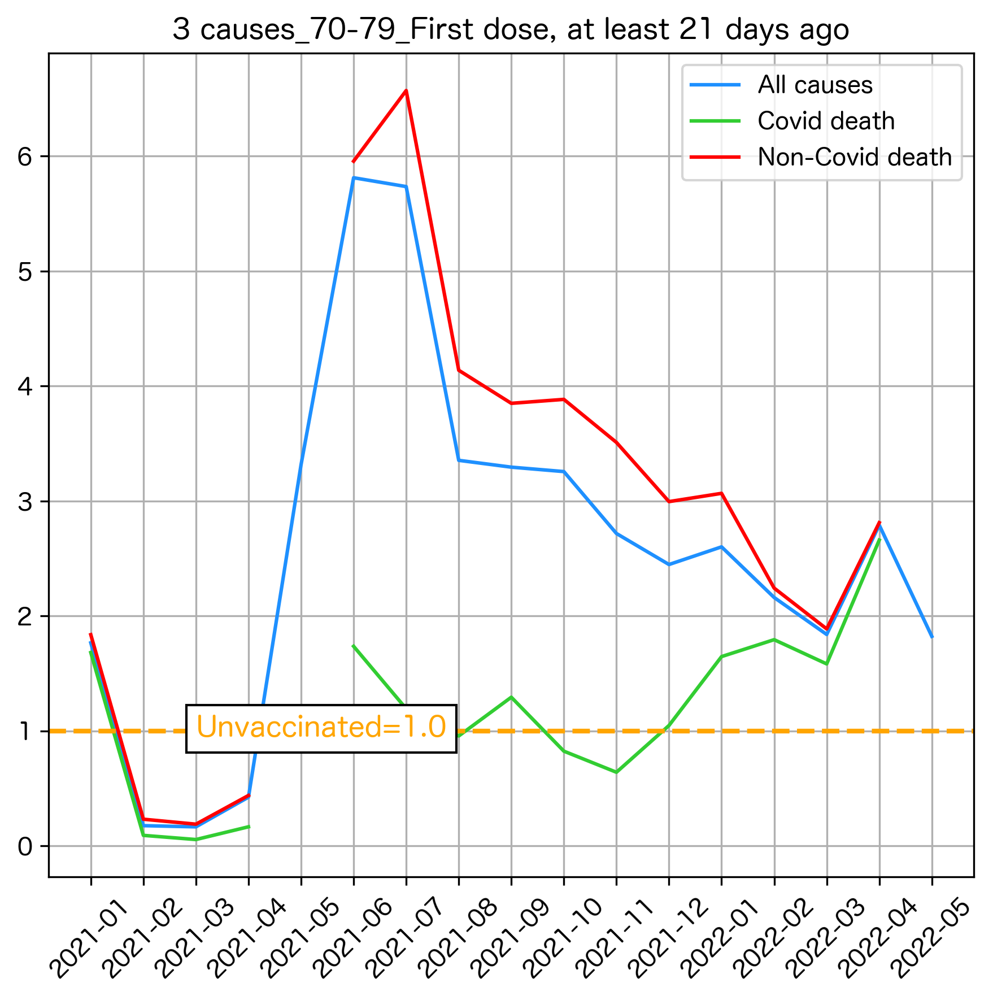

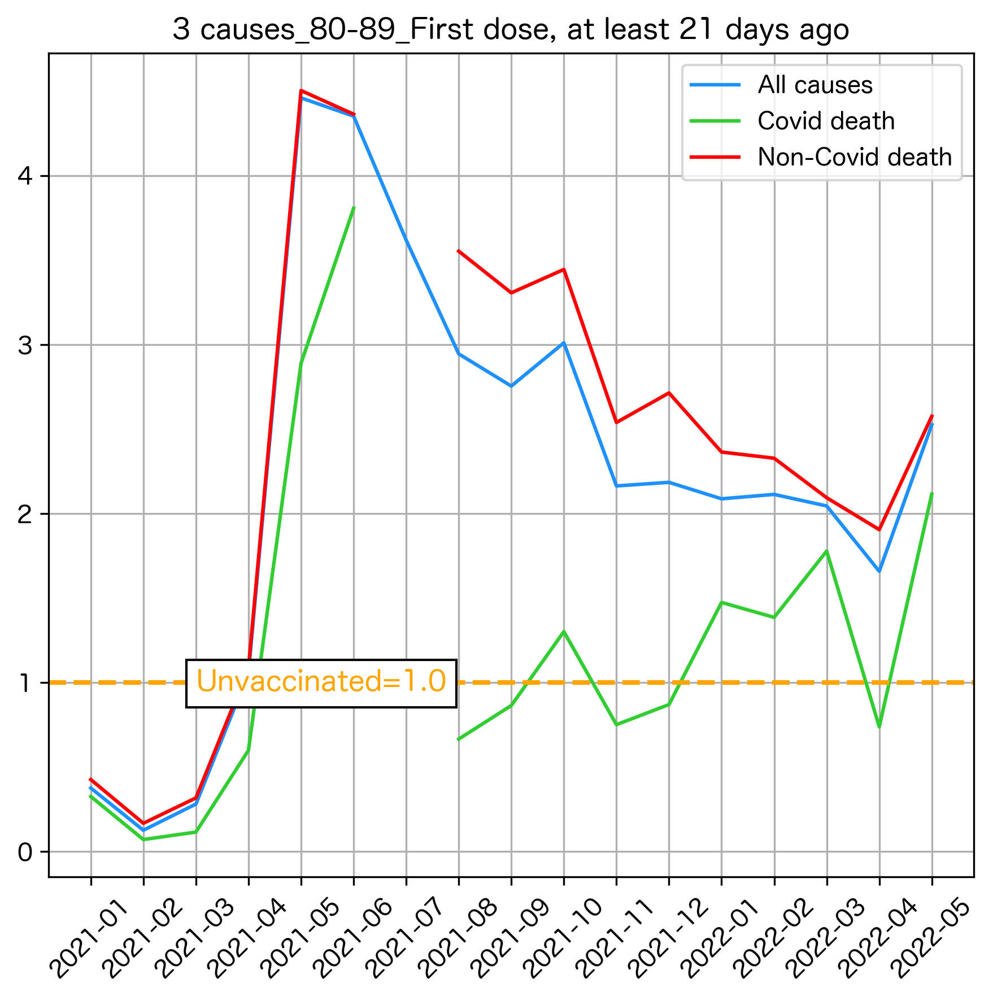

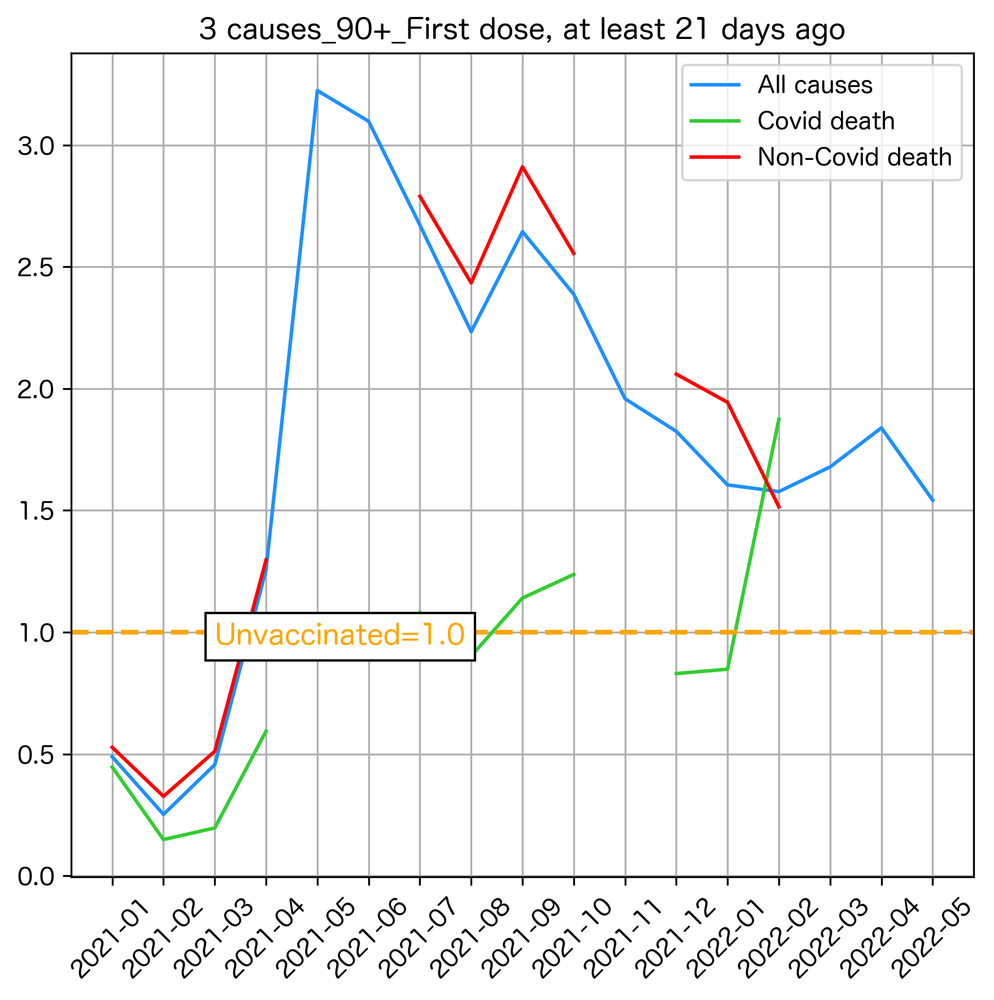

In [102]:
AgeGroup_lst = ['18-39','40-49', '50-59', '60-69', '70-79', '80-89', '90+']
import copy
import os

v_status = 'First dose, at least 21 days ago'
print('[Vax status: ', v_status, ']')

fig_size = (6,6)
save_path = 'results/England_Death_EN202205/3-causes-1doses'
os.makedirs(save_path,exist_ok=True)

for AgeGroup in AgeGroup_lst:
    fig,ax=plt.subplots()
    #select_df = df[(df['Sex']==sex) & (df['Age group']==AgeGroup) & (df['Cause of Death']==CauseOfDeath)] #& (df['Date'] > '2021-09')]
    select_df0 = new_df[(new_df['Age group']==AgeGroup) & (new_df['Cause of Death']=='All causes')].reset_index(drop=True) #  & (df['Date'] > '2021-07')
    select_df1 = new_df[(new_df['Age group']==AgeGroup) & (new_df['Cause of Death']=='Deaths involving COVID-19')].reset_index(drop=True) #  & (df['Date'] > '2021-07')
    select_df = copy.deepcopy(select_df0)
    select_df['Morality_rate_per100K'] = select_df0['Morality_rate_per100K'] - select_df1['Morality_rate_per100K']
    #for v_status in vax_status_lst:
        
    # all cause
    risk_lst = select_df0[select_df0['Vaccination status']==v_status]['Morality_rate_per100K'].reset_index(drop=True) / select_df0[select_df0['Vaccination status']=='Unvaccinated']['Morality_rate_per100K'].reset_index(drop=True)
    plt_df = select_df0[select_df0['Vaccination status'] == 'Unvaccinated'][['Date']].reset_index(drop=True) #,'Morality_rate_per100K']].reset_index(drop=True)
    plt_df['xdose/unvax'] = risk_lst
    #plt.plot(plt_df['Date'],plt_df['xdose/unvax'])
    plt.plot(plt_df['Date'],plt_df['xdose/unvax'], color="dodgerblue")
    # covid death
    risk_lst = select_df1[select_df1['Vaccination status']==v_status]['Morality_rate_per100K'].reset_index(drop=True) / select_df1[select_df1['Vaccination status']=='Unvaccinated']['Morality_rate_per100K'].reset_index(drop=True)
    plt_df = select_df1[select_df1['Vaccination status'] == 'Unvaccinated'][['Date']].reset_index(drop=True) #,'Morality_rate_per100K']].reset_index(drop=True)
    plt_df['xdose/unvax'] = risk_lst
    #plt.plot(plt_df['Date'],plt_df['xdose/unvax'])
    plt.plot(plt_df['Date'],plt_df['xdose/unvax'], color="limegreen")
    # non covid death
    risk_lst = select_df[select_df['Vaccination status']==v_status]['Morality_rate_per100K'].reset_index(drop=True) / select_df[select_df['Vaccination status']=='Unvaccinated']['Morality_rate_per100K'].reset_index(drop=True)
    plt_df = select_df[select_df['Vaccination status'] == 'Unvaccinated'][['Date']].reset_index(drop=True) #,'Morality_rate_per100K']].reset_index(drop=True)
    plt_df['xdose/unvax'] = risk_lst
    #plt.plot(plt_df['Date'],plt_df['xdose/unvax'])
    plt.plot(plt_df['Date'],plt_df['xdose/unvax'], color="red")
    ax.text(2,0.95,'Unvaccinated=1.0',color="orange",fontsize=12,bbox=dict(facecolor='white', edgecolor=None, alpha=1))
    plt.axhline(y=1.0, color="orange", linestyle="--",linewidth = 2)
    
    ax.tick_params(axis='x', labelrotation=45)
    fig.set_dpi(300)
    fig.set_size_inches(fig_size)
    ax.legend(['All causes','Covid death','Non-Covid death'])
    plt.title('_'.join(['3 causes', AgeGroup,v_status]))
    plt.grid()
    plt.tight_layout()
    filename = ' '.join(['【3-causes-Mortality-Relative-Risk】',AgeGroup, v_status])+str(fig_size)+'.png'
    fig.savefig(os.path.join(save_path,filename),facecolor='white', transparent=False)
    
AgeGroup_lst = ['18-39', '40-49', '50-59', '60-69', '70-79', '80-89', '90+']

# Same Age diff causes, 2dose

In [103]:
plt.rcParams["font.sans-serif"]=['Source Han Sans TW', 'sans-serif'] #['Source Han Sans TW'] #["SimHei"] #设置字体

In [104]:
matplotlib.matplotlib_fname()

'/opt/anaconda3/lib/python3.9/site-packages/matplotlib/mpl-data/matplotlibrc'

[Vax status:  Second dose, at least 21 days ago ]


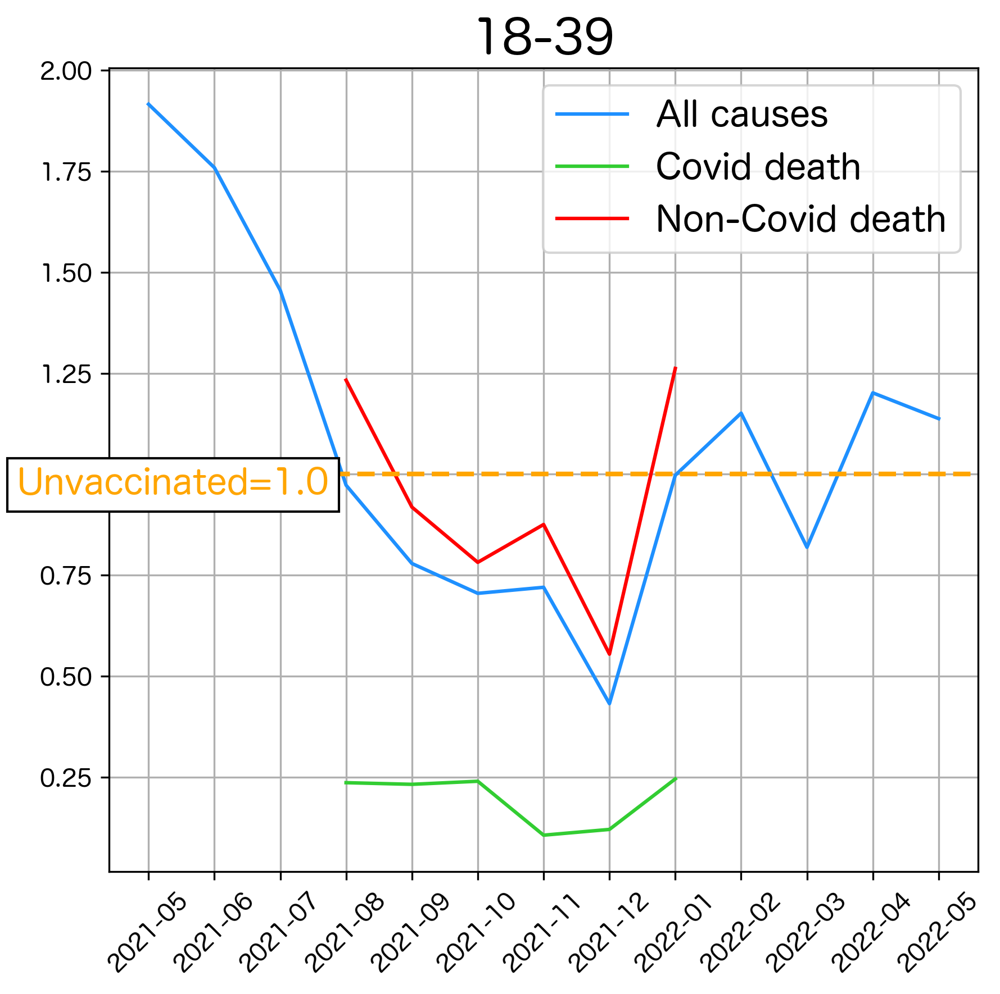

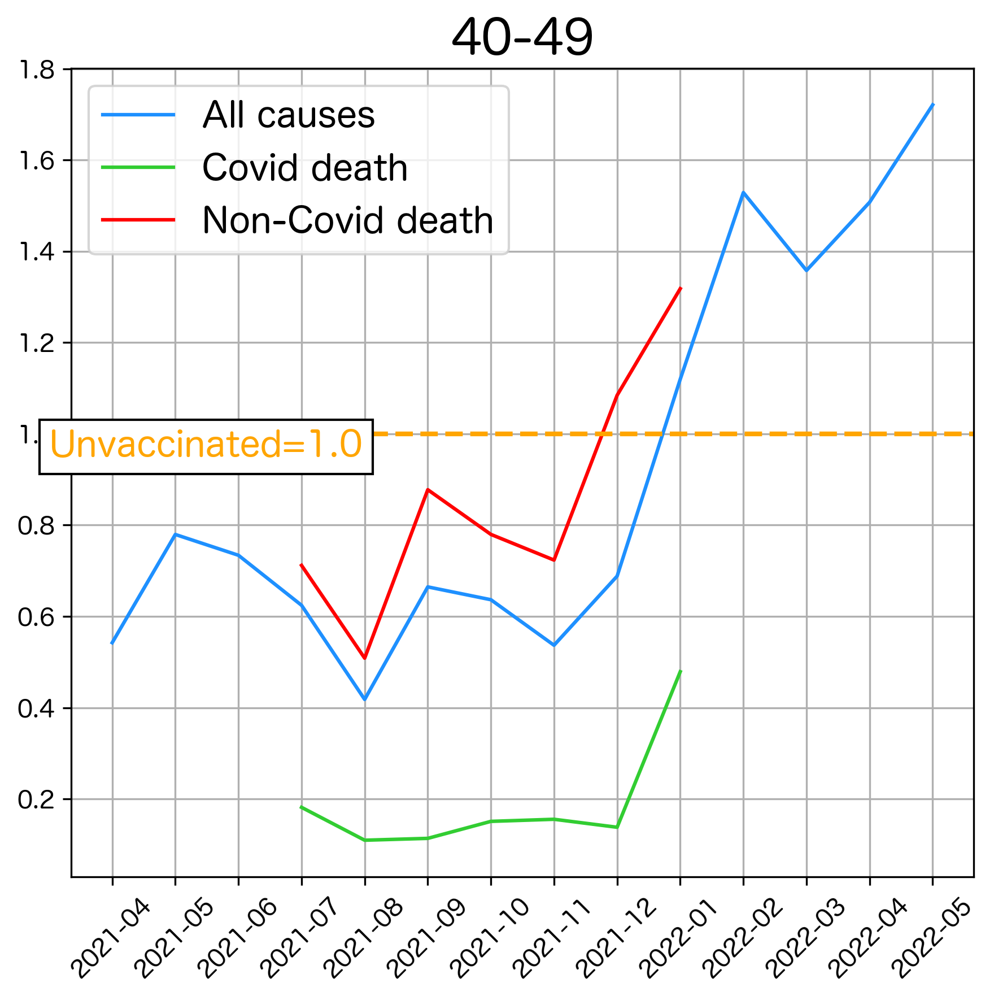

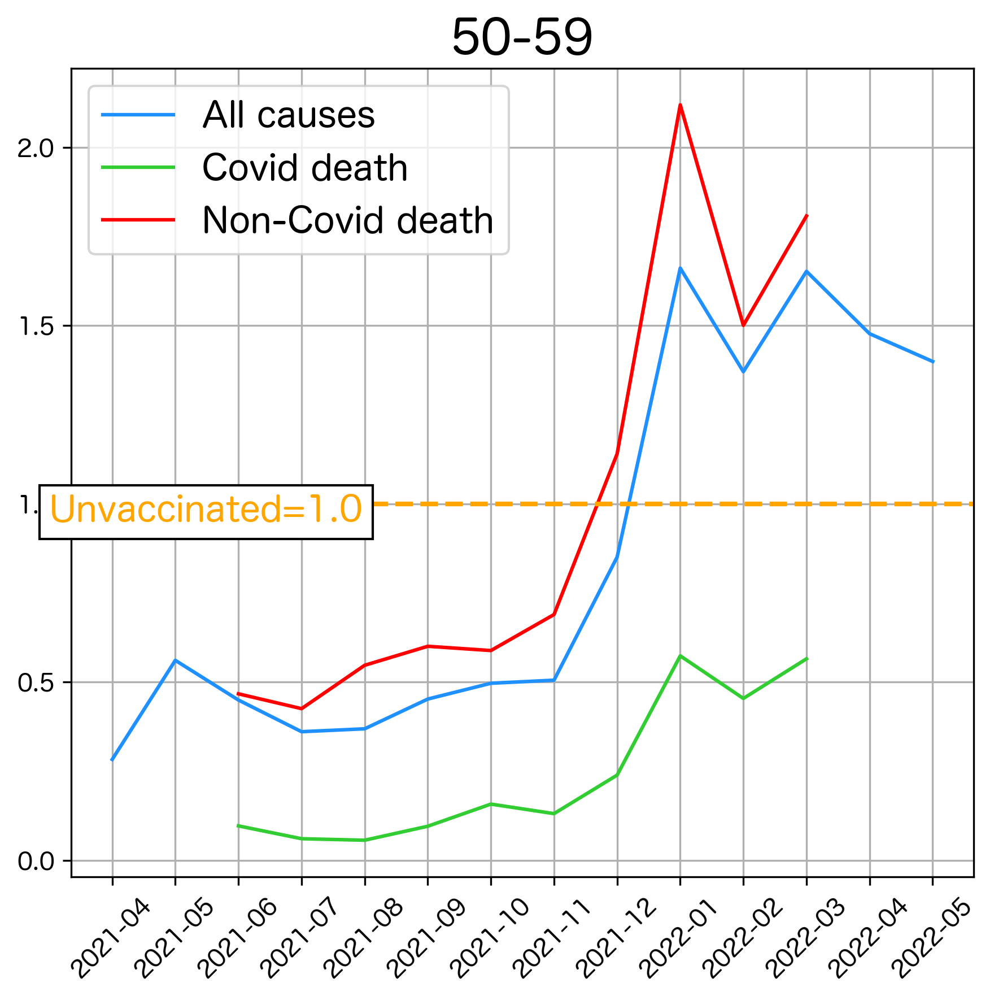

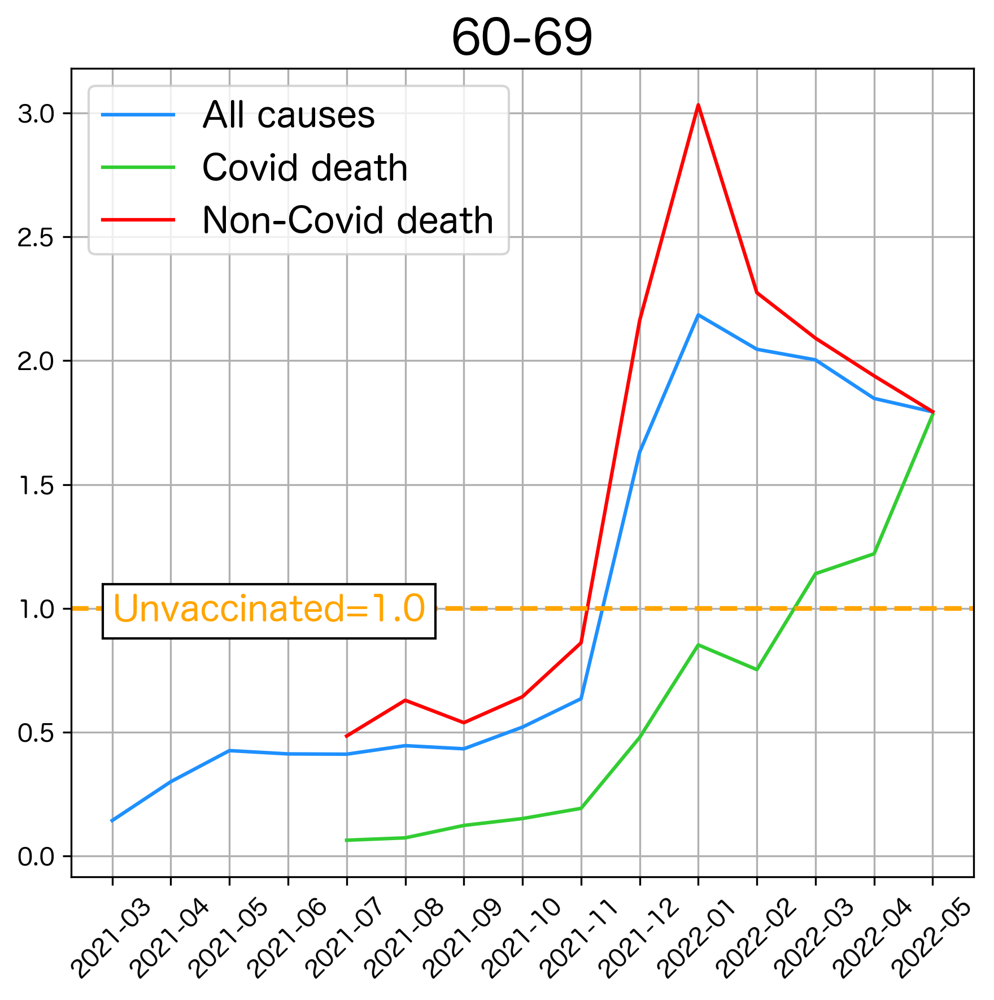

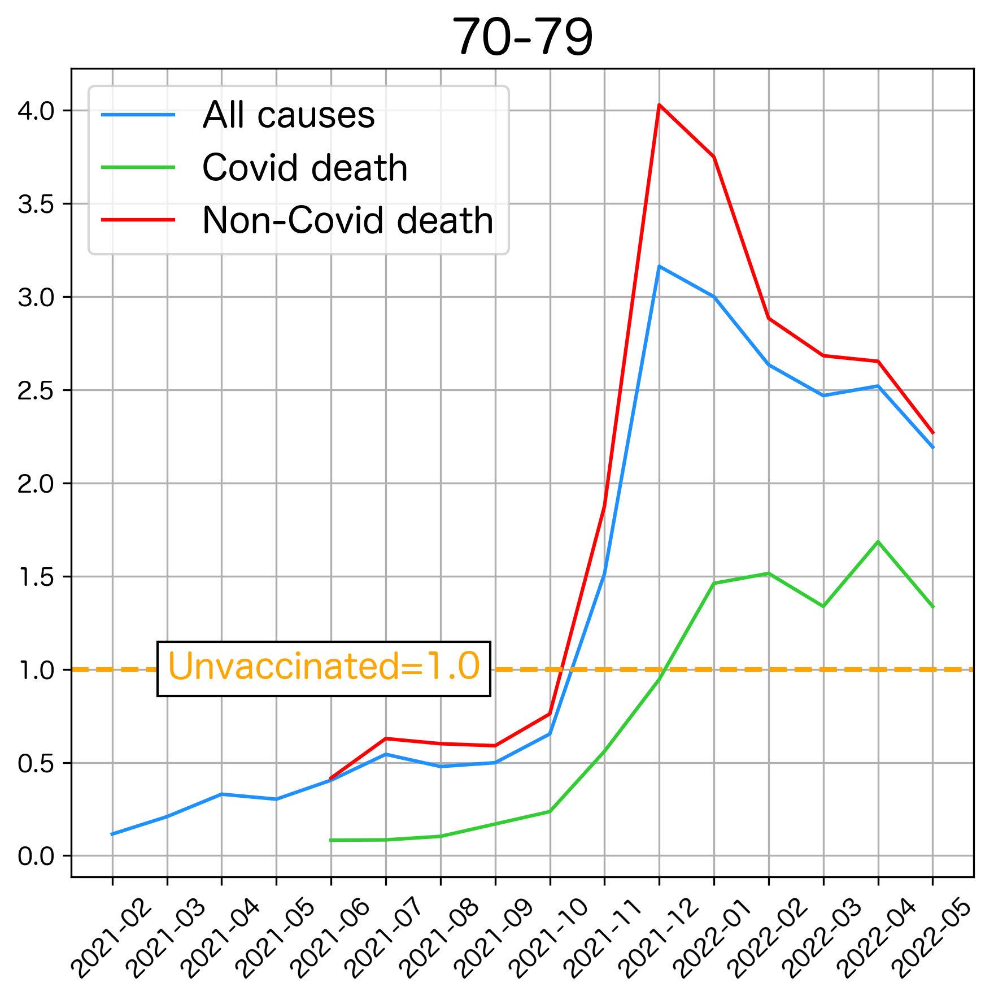

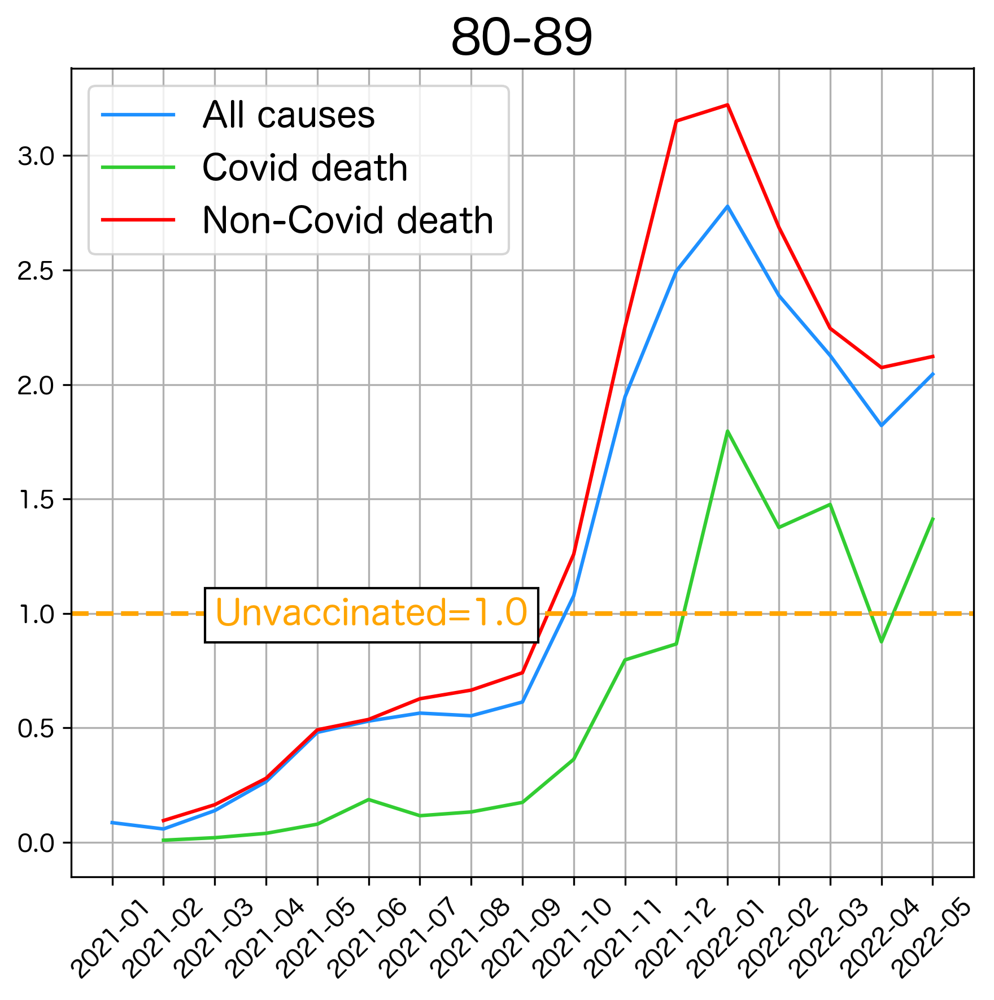

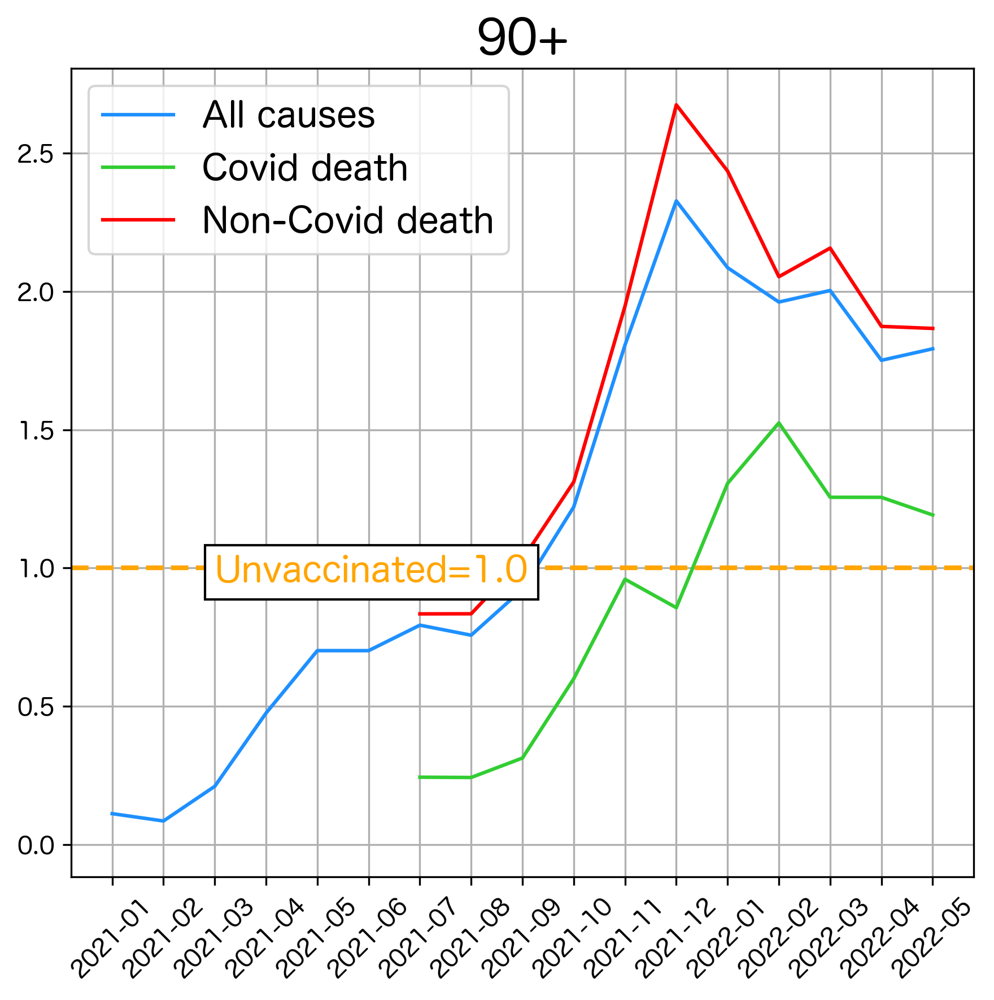

In [105]:
AgeGroup_lst = ['18-39','40-49', '50-59', '60-69', '70-79', '80-89', '90+']
import copy
import os

fig_size = (6,6)
save_path = 'results/England_Death_EN202205/3-causes-2doses'
os.makedirs(save_path,exist_ok=True)

v_status = 'Second dose, at least 21 days ago'
print('[Vax status: ', v_status, ']')

for AgeGroup in AgeGroup_lst:
    fig,ax=plt.subplots()
    #select_df = df[(df['Sex']==sex) & (df['Age group']==AgeGroup) & (df['Cause of Death']==CauseOfDeath)] #& (df['Date'] > '2021-09')]
    select_df0 = new_df[(new_df['Age group']==AgeGroup) & (new_df['Cause of Death']=='All causes')].reset_index(drop=True) #  & (df['Date'] > '2021-07')
    select_df1 = new_df[(new_df['Age group']==AgeGroup) & (new_df['Cause of Death']=='Deaths involving COVID-19')].reset_index(drop=True) #  & (df['Date'] > '2021-07')
    select_df = copy.deepcopy(select_df0)
    select_df['Morality_rate_per100K'] = select_df0['Morality_rate_per100K'] - select_df1['Morality_rate_per100K']
    #for v_status in vax_status_lst:
        
    # all cause
    risk_lst = select_df0[select_df0['Vaccination status']==v_status]['Morality_rate_per100K'].reset_index(drop=True) / select_df0[select_df0['Vaccination status']=='Unvaccinated']['Morality_rate_per100K'].reset_index(drop=True)
    plt_df = select_df0[select_df0['Vaccination status'] == 'Unvaccinated'][['Date']].reset_index(drop=True) #,'Morality_rate_per100K']].reset_index(drop=True)
    plt_df['xdose/unvax'] = risk_lst
    #plt.plot(plt_df['Date'],plt_df['xdose/unvax'])
    plt.plot(plt_df['Date'],plt_df['xdose/unvax'], color="dodgerblue")
    # covid death
    risk_lst = select_df1[select_df1['Vaccination status']==v_status]['Morality_rate_per100K'].reset_index(drop=True) / select_df1[select_df1['Vaccination status']=='Unvaccinated']['Morality_rate_per100K'].reset_index(drop=True)
    plt_df = select_df1[select_df1['Vaccination status'] == 'Unvaccinated'][['Date']].reset_index(drop=True) #,'Morality_rate_per100K']].reset_index(drop=True)
    plt_df['xdose/unvax'] = risk_lst
    #plt.plot(plt_df['Date'],plt_df['xdose/unvax'])
    plt.plot(plt_df['Date'],plt_df['xdose/unvax'], color="limegreen")
    # non covid death
    risk_lst = select_df[select_df['Vaccination status']==v_status]['Morality_rate_per100K'].reset_index(drop=True) / select_df[select_df['Vaccination status']=='Unvaccinated']['Morality_rate_per100K'].reset_index(drop=True)
    plt_df = select_df[select_df['Vaccination status'] == 'Unvaccinated'][['Date']].reset_index(drop=True) #,'Morality_rate_per100K']].reset_index(drop=True)
    plt_df['xdose/unvax'] = risk_lst
    #plt.plot(plt_df['Date'],plt_df['xdose/unvax'])
    plt.plot(plt_df['Date'],plt_df['xdose/unvax'], color="red")
    ax.text(2,0.95,'Unvaccinated=1.0',color="orange",fontsize=15,bbox=dict(facecolor='white', edgecolor=None, alpha=1))
    plt.axhline(y=1.0, color="orange", linestyle="--",linewidth = 2)
    ax.tick_params(axis='x', labelrotation=45)
    fig.set_dpi(300)
    fig.set_size_inches(fig_size)
    ax.legend(['All causes','Covid death','Non-Covid death'],prop={'size': 15})
    #plt.title('_'.join(['3 causes', AgeGroup,v_status]))
    plt.title(AgeGroup,fontsize=20)
    plt.grid()
    plt.tight_layout()
    filename = ' '.join(['【3-causes-Mortality-Relative-Risk】',AgeGroup, v_status])+str(fig_size)+'.png'
    fig.savefig(os.path.join(save_path,filename),facecolor='white', transparent=False)


# Same Age diff cause, 3dose

[Vax status:  Third dose or booster, at least 21 days ago ]


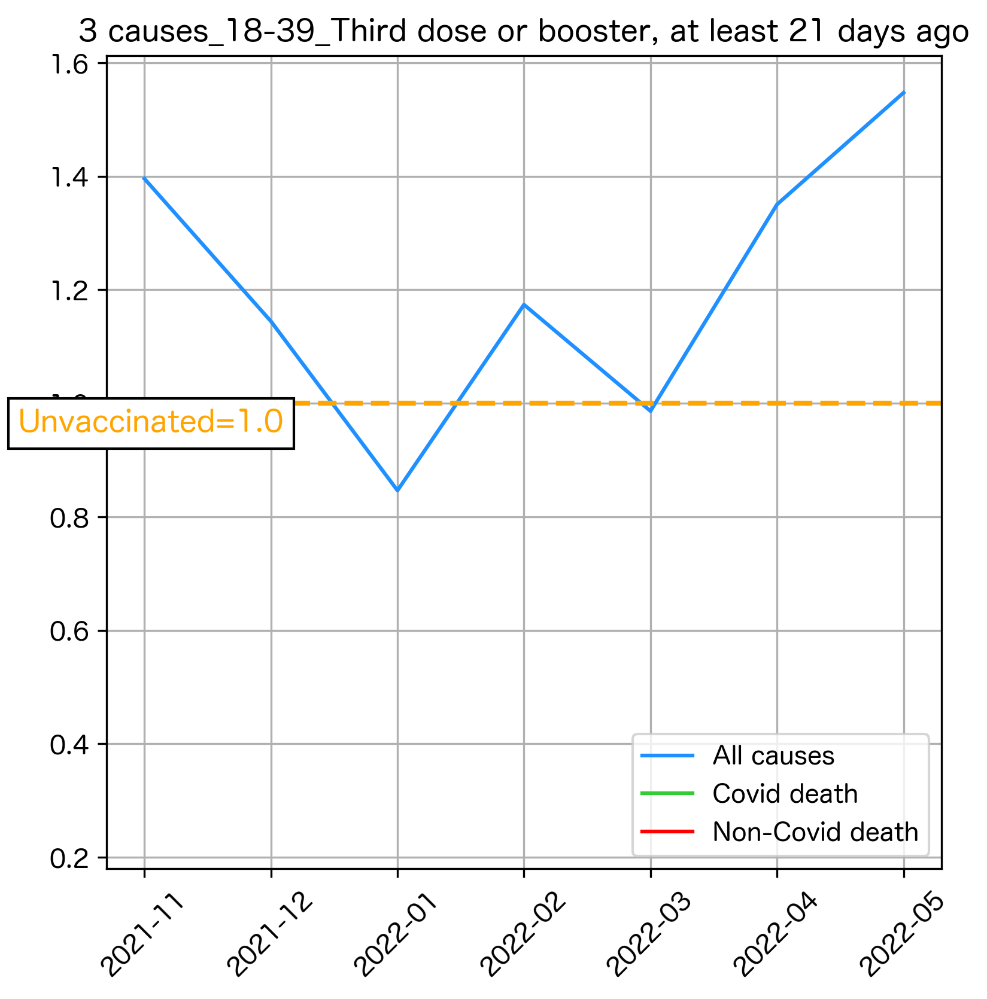

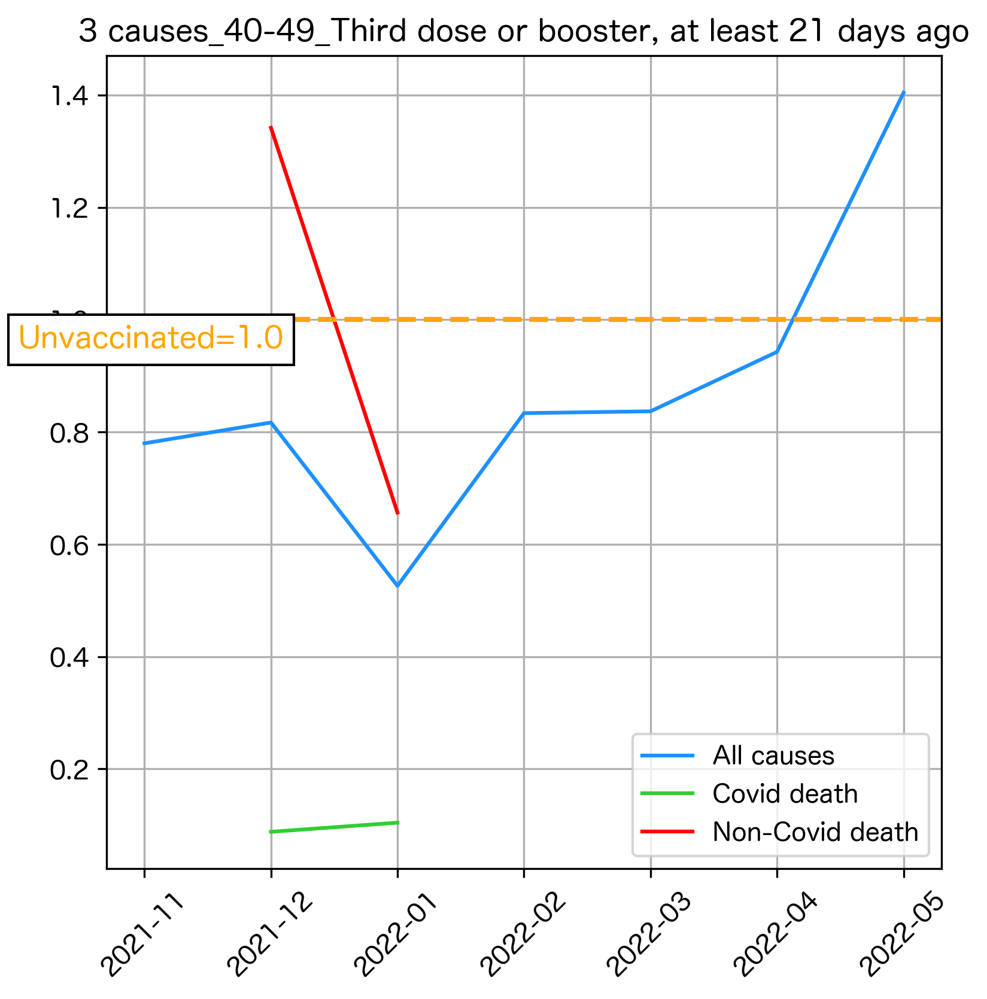

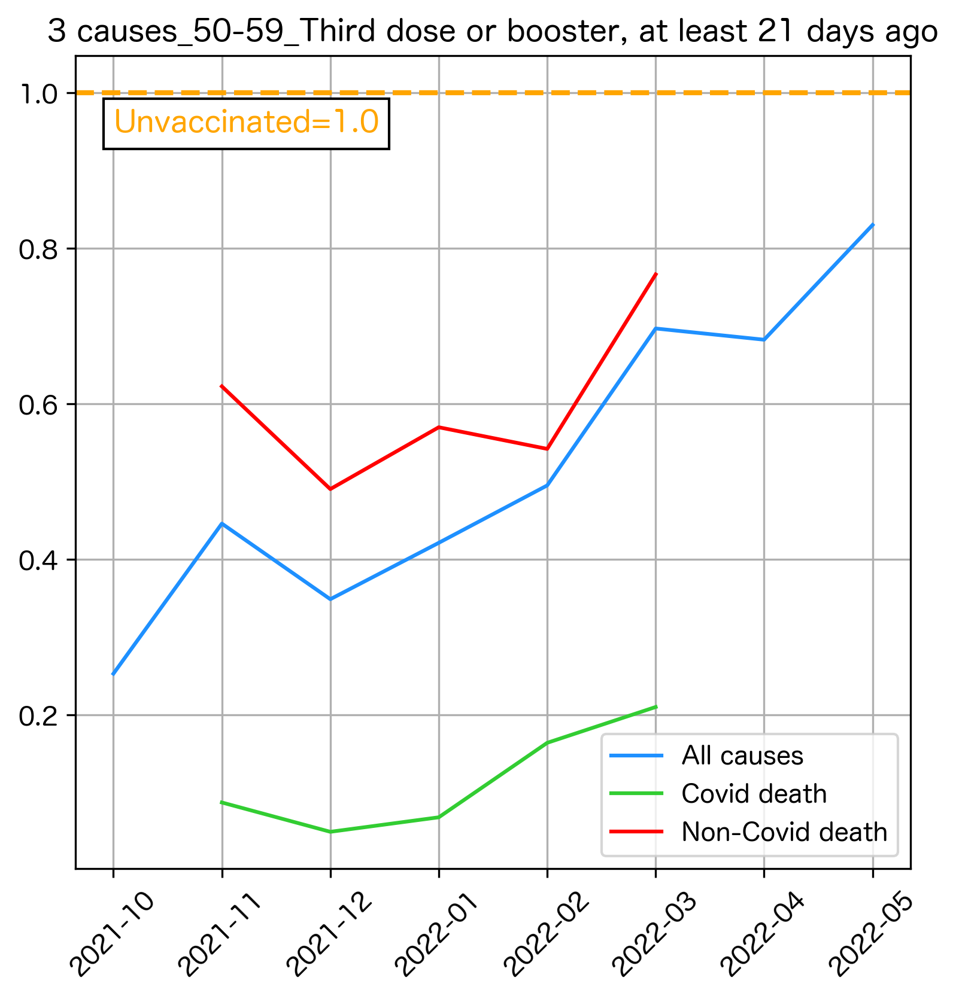

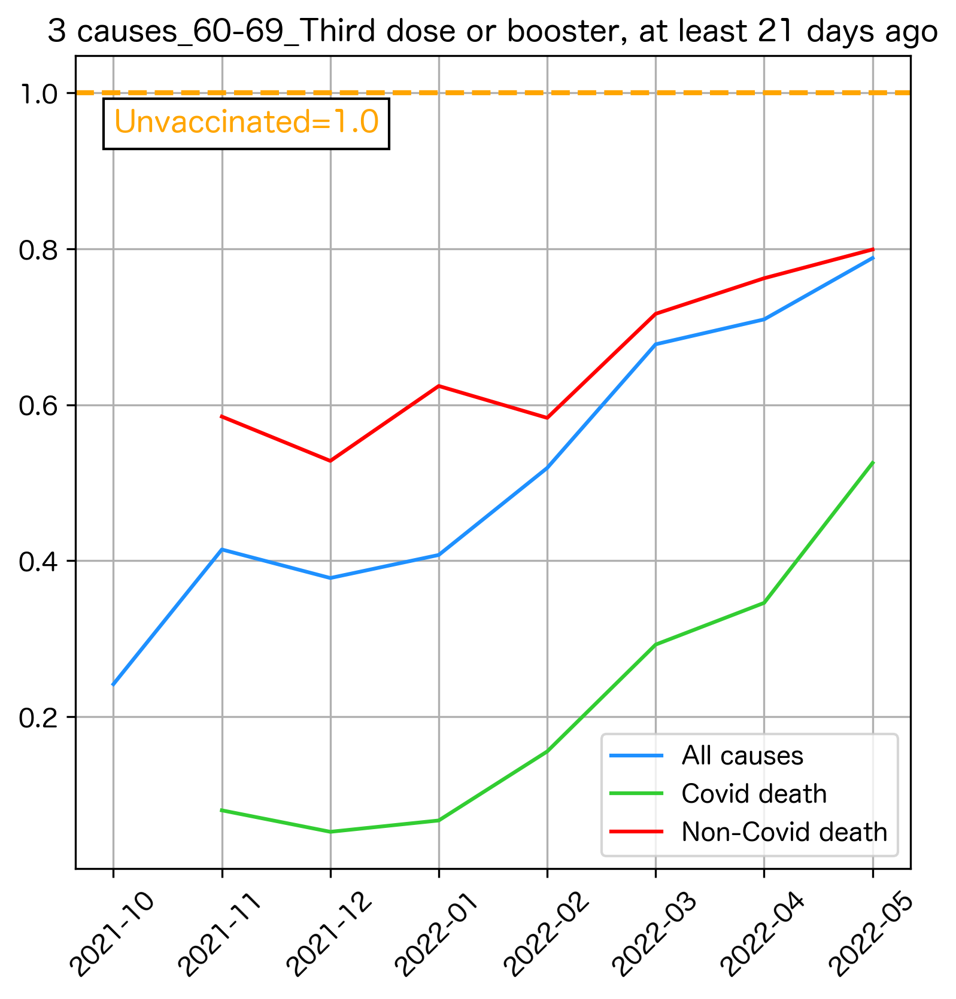

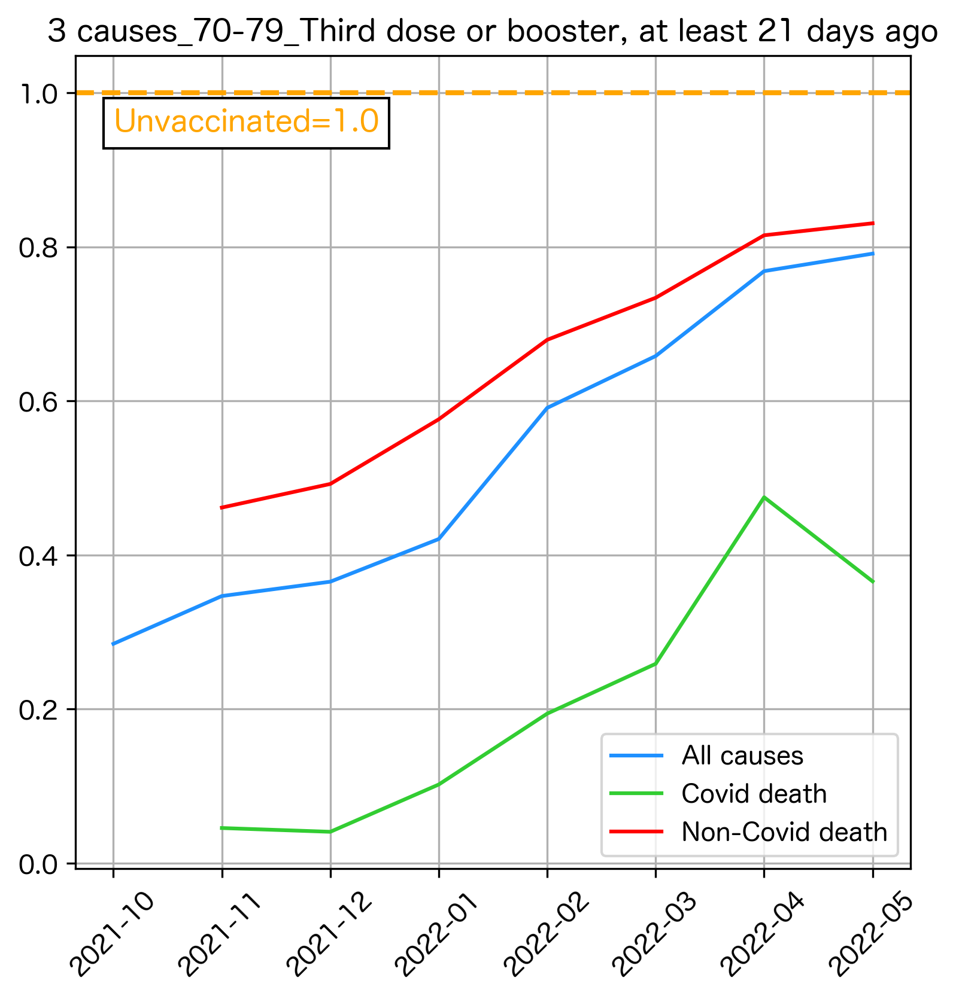

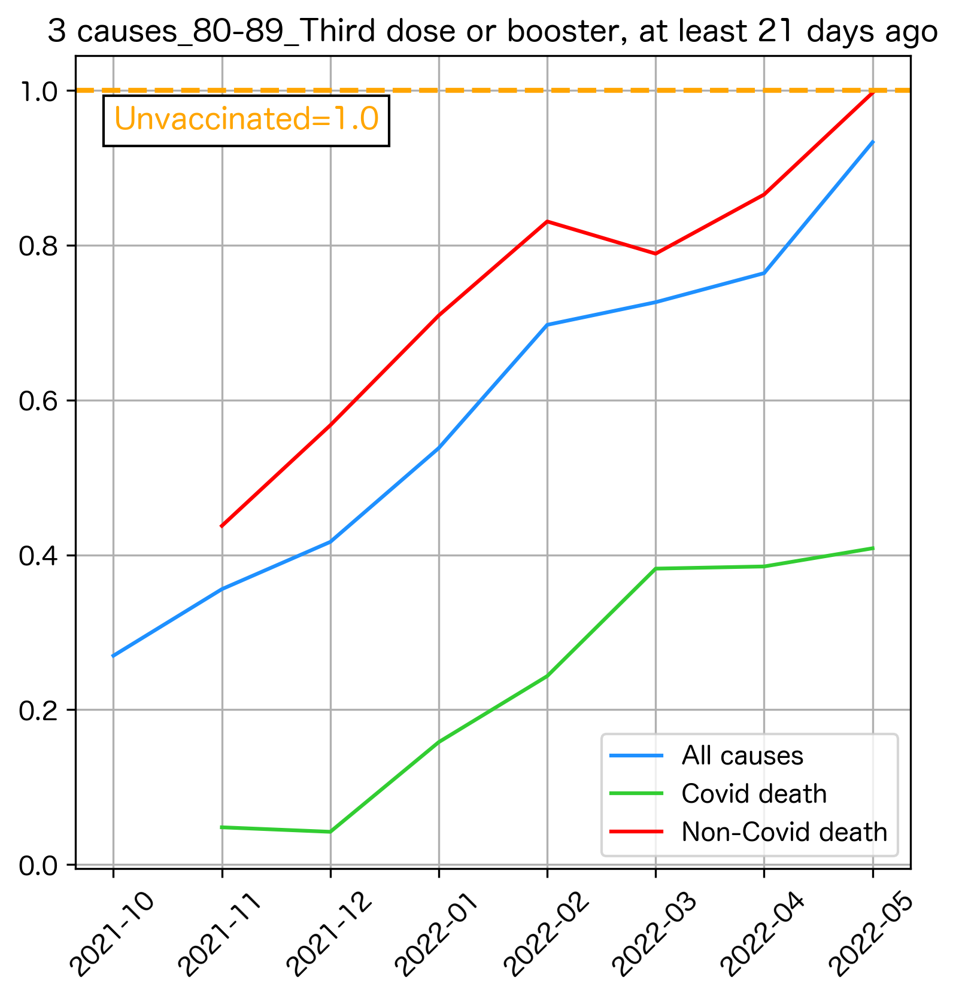

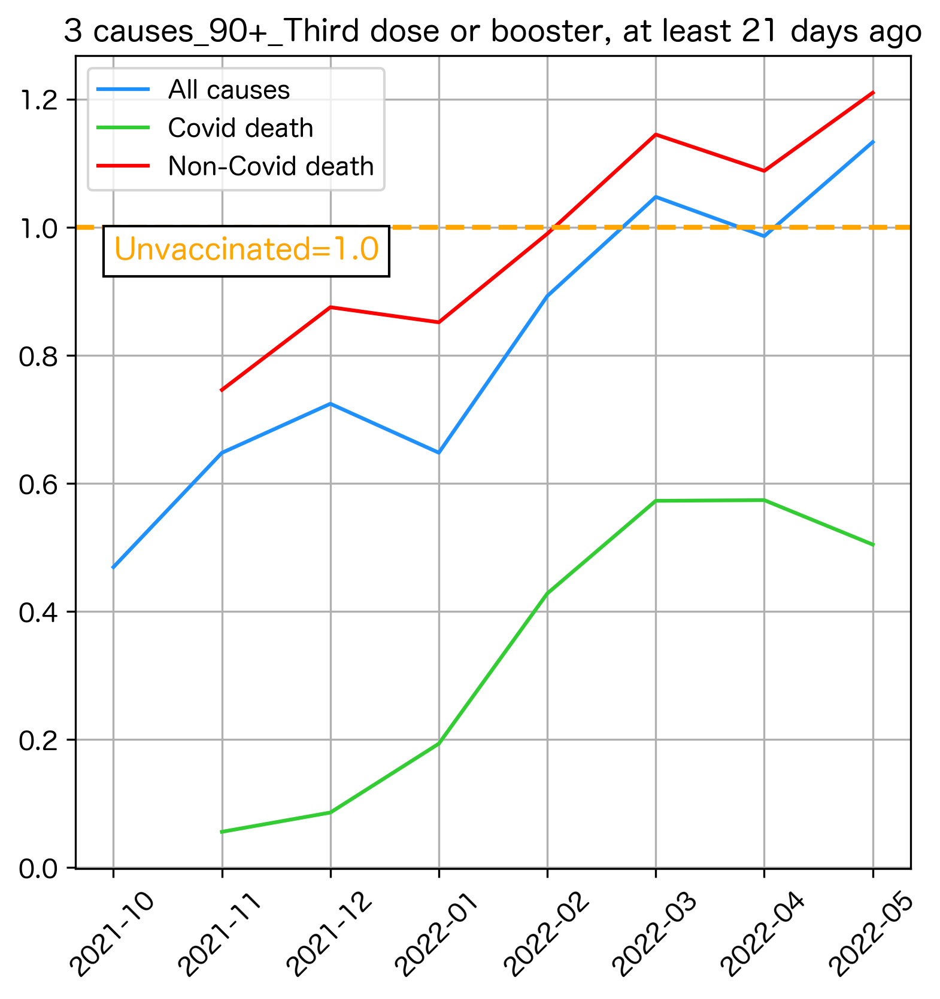

In [106]:
AgeGroup_lst = ['18-39','40-49', '50-59', '60-69', '70-79', '80-89', '90+']
import copy
import os 
v_status = 'Third dose or booster, at least 21 days ago'
fig_size = (6,6)
save_path = 'results/England_Death_EN202205/3-causes-3doses'
os.makedirs(save_path,exist_ok=True)

print('[Vax status: ', v_status, ']')

for AgeGroup in AgeGroup_lst:
    fig,ax=plt.subplots()
    #select_df = df[(df['Sex']==sex) & (df['Age group']==AgeGroup) & (df['Cause of Death']==CauseOfDeath)] #& (df['Date'] > '2021-09')]
    select_df0 = new_df[(new_df['Age group']==AgeGroup) & (new_df['Cause of Death']=='All causes')].reset_index(drop=True) #  & (df['Date'] > '2021-07')
    select_df1 = new_df[(new_df['Age group']==AgeGroup) & (new_df['Cause of Death']=='Deaths involving COVID-19')].reset_index(drop=True) #  & (df['Date'] > '2021-07')
    select_df = copy.deepcopy(select_df0)
    select_df['Morality_rate_per100K'] = select_df0['Morality_rate_per100K'] - select_df1['Morality_rate_per100K']
    #for v_status in vax_status_lst:
        
    # all cause
    risk_lst = select_df0[select_df0['Vaccination status']==v_status]['Morality_rate_per100K'].reset_index(drop=True) / select_df0[select_df0['Vaccination status']=='Unvaccinated']['Morality_rate_per100K'].reset_index(drop=True)
    plt_df = select_df0[select_df0['Vaccination status'] == 'Unvaccinated'][['Date']].reset_index(drop=True) #,'Morality_rate_per100K']].reset_index(drop=True)
    plt_df['xdose/unvax'] = risk_lst
    #plt.plot(plt_df['Date'],plt_df['xdose/unvax'])
    plt.plot(plt_df['Date'],plt_df['xdose/unvax'], color="dodgerblue")
    # covid death
    risk_lst = select_df1[select_df1['Vaccination status']==v_status]['Morality_rate_per100K'].reset_index(drop=True) / select_df1[select_df1['Vaccination status']=='Unvaccinated']['Morality_rate_per100K'].reset_index(drop=True)
    plt_df = select_df1[select_df1['Vaccination status'] == 'Unvaccinated'][['Date']].reset_index(drop=True) #,'Morality_rate_per100K']].reset_index(drop=True)
    plt_df['xdose/unvax'] = risk_lst
    #plt.plot(plt_df['Date'],plt_df['xdose/unvax'])
    plt.plot(plt_df['Date'],plt_df['xdose/unvax'], color="limegreen")
    # non covid death
    risk_lst = select_df[select_df['Vaccination status']==v_status]['Morality_rate_per100K'].reset_index(drop=True) / select_df[select_df['Vaccination status']=='Unvaccinated']['Morality_rate_per100K'].reset_index(drop=True)
    plt_df = select_df[select_df['Vaccination status'] == 'Unvaccinated'][['Date']].reset_index(drop=True) #,'Morality_rate_per100K']].reset_index(drop=True)
    plt_df['xdose/unvax'] = risk_lst
    #plt.plot(plt_df['Date'],plt_df['xdose/unvax'])
    plt.plot(plt_df['Date'],plt_df['xdose/unvax'], color="red")
    ax.text(9,0.95,'Unvaccinated=1.0',color="orange",fontsize=12,bbox=dict(facecolor='white', edgecolor=None, alpha=1))
    plt.axhline(y=1.0, color="orange", linestyle="--",linewidth = 2)

    ax.tick_params(axis='x', labelrotation=45)
    fig.set_dpi(300)
    fig.set_size_inches(fig_size)
    ax.legend(['All causes','Covid death','Non-Covid death'])
    plt.title('_'.join(['3 causes', AgeGroup,v_status]))
    plt.grid()
    filename = ' '.join(['【3-causes-Mortality-Rate】',AgeGroup, v_status])+str(fig_size)+'.png'
    fig.savefig(os.path.join(save_path,filename),facecolor='white', transparent=False)
    
AgeGroup_lst = ['18-39', '40-49', '50-59', '60-69', '70-79', '80-89', '90+']

# Playground

# age group separeted

[Vax status:  Second dose, at least 21 days ago ]


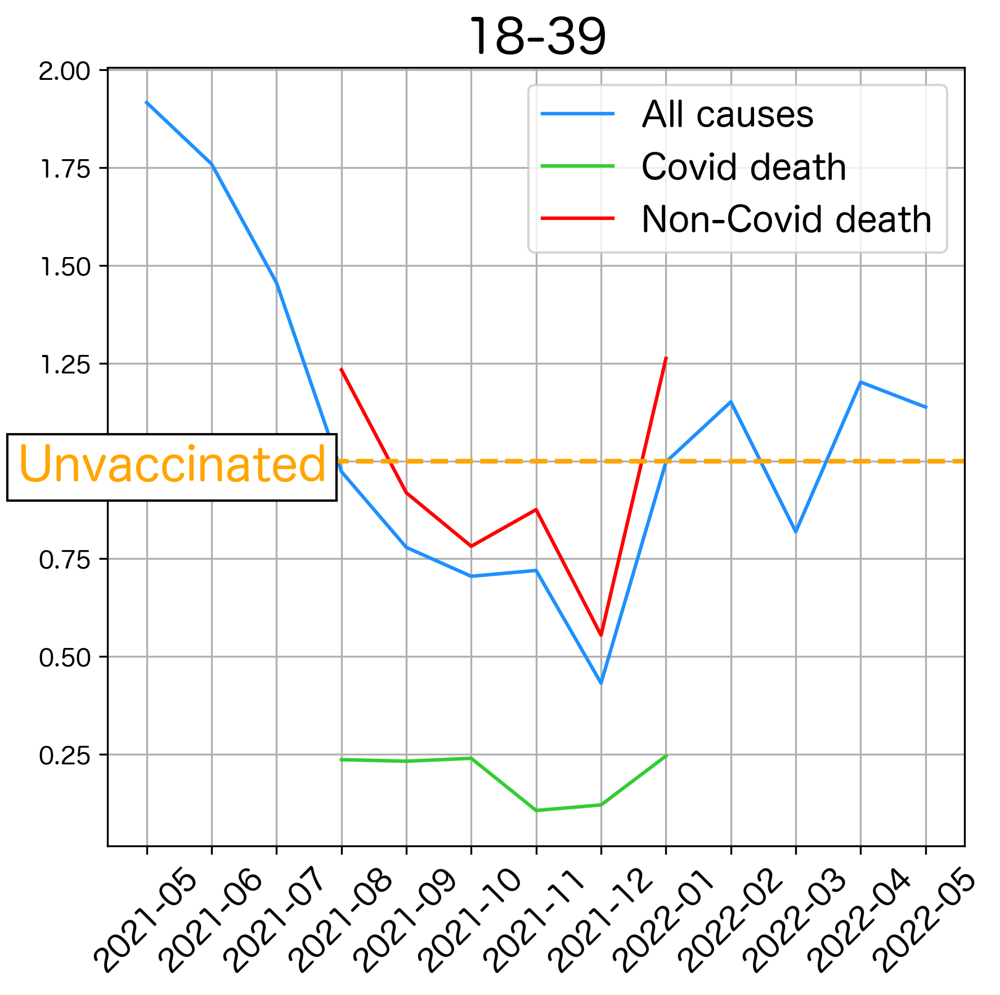

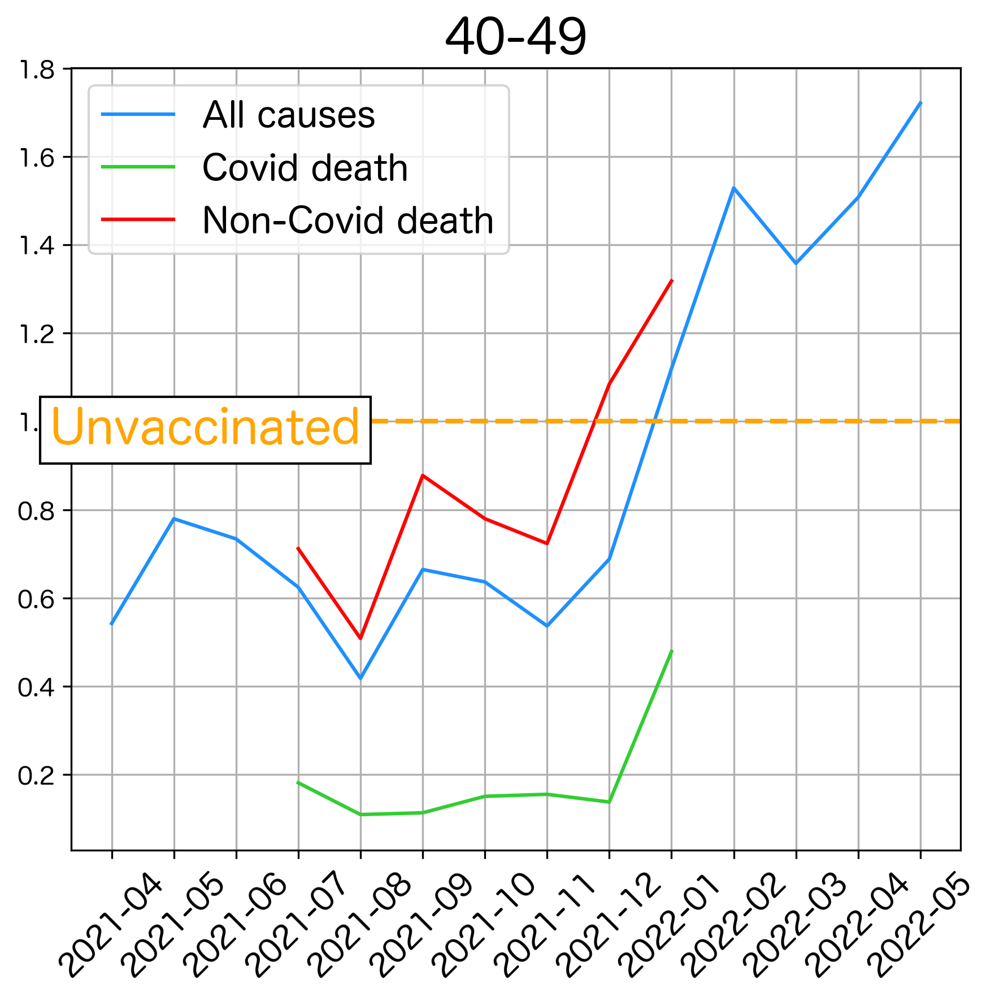

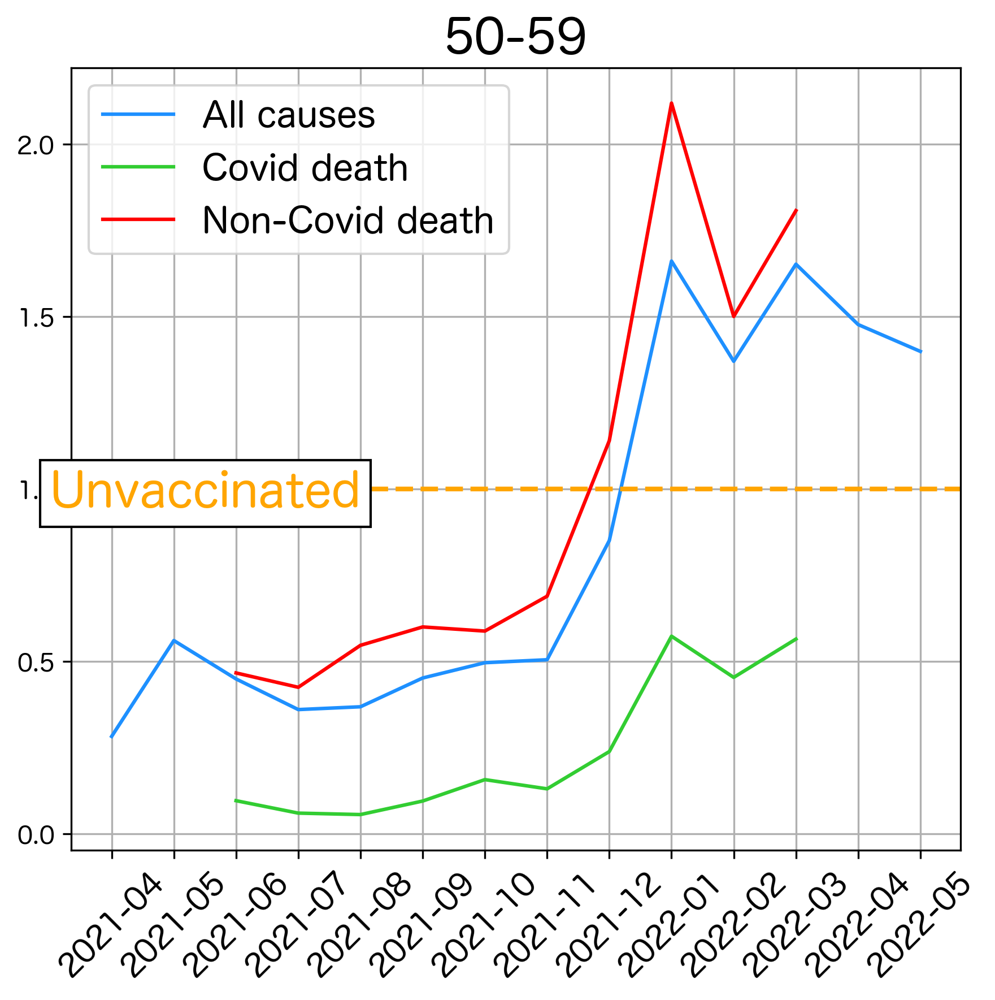

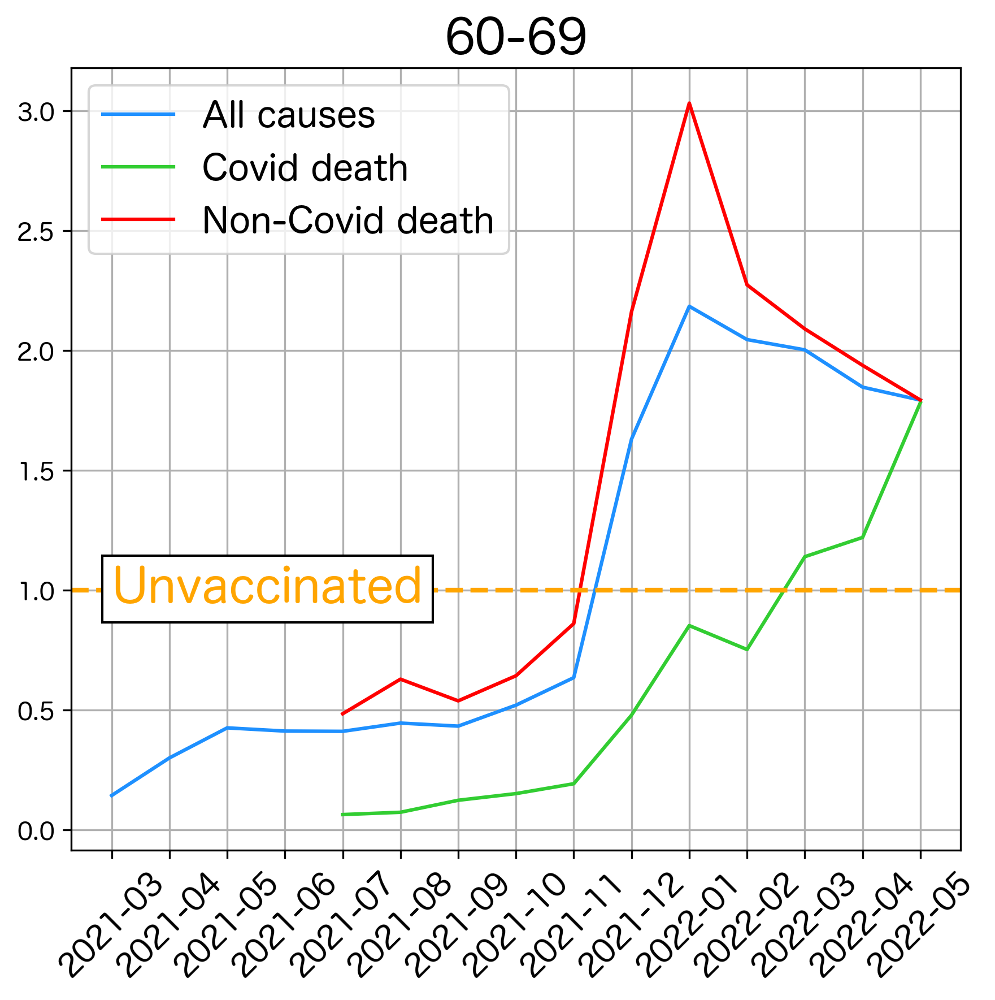

In [228]:
AgeGroup_lst = ['18-39','40-49', '50-59', '60-69', '70-79', '80-89', '90+']
import copy
import os

fig_size = (6,6)
save_path = 'results/England_Death_EN202205/3-causes-2doses'
os.makedirs(save_path,exist_ok=True)

v_status = 'Second dose, at least 21 days ago'
print('[Vax status: ', v_status, ']')

for AgeGroup in AgeGroup_lst[:4]:
    fig,ax=plt.subplots()
    #select_df = df[(df['Sex']==sex) & (df['Age group']==AgeGroup) & (df['Cause of Death']==CauseOfDeath)] #& (df['Date'] > '2021-09')]
    select_df0 = new_df[(new_df['Age group']==AgeGroup) & (new_df['Cause of Death']=='All causes')].reset_index(drop=True) #  & (df['Date'] > '2021-07')
    select_df1 = new_df[(new_df['Age group']==AgeGroup) & (new_df['Cause of Death']=='Deaths involving COVID-19')].reset_index(drop=True) #  & (df['Date'] > '2021-07')
    select_df = copy.deepcopy(select_df0)
    select_df['Morality_rate_per100K'] = select_df0['Morality_rate_per100K'] - select_df1['Morality_rate_per100K']
    #for v_status in vax_status_lst:
        
    # all cause
    risk_lst = select_df0[select_df0['Vaccination status']==v_status]['Morality_rate_per100K'].reset_index(drop=True) / select_df0[select_df0['Vaccination status']=='Unvaccinated']['Morality_rate_per100K'].reset_index(drop=True)
    plt_df = select_df0[select_df0['Vaccination status'] == 'Unvaccinated'][['Date']].reset_index(drop=True) #,'Morality_rate_per100K']].reset_index(drop=True)
    plt_df['xdose/unvax'] = risk_lst
    #plt.plot(plt_df['Date'],plt_df['xdose/unvax'])
    plt.plot(plt_df['Date'],plt_df['xdose/unvax'], color="dodgerblue")
    # covid death
    risk_lst = select_df1[select_df1['Vaccination status']==v_status]['Morality_rate_per100K'].reset_index(drop=True) / select_df1[select_df1['Vaccination status']=='Unvaccinated']['Morality_rate_per100K'].reset_index(drop=True)
    plt_df = select_df1[select_df1['Vaccination status'] == 'Unvaccinated'][['Date']].reset_index(drop=True) #,'Morality_rate_per100K']].reset_index(drop=True)
    plt_df['xdose/unvax'] = risk_lst
    #plt.plot(plt_df['Date'],plt_df['xdose/unvax'])
    plt.plot(plt_df['Date'],plt_df['xdose/unvax'], color="limegreen")
    # non covid death
    risk_lst = select_df[select_df['Vaccination status']==v_status]['Morality_rate_per100K'].reset_index(drop=True) / select_df[select_df['Vaccination status']=='Unvaccinated']['Morality_rate_per100K'].reset_index(drop=True)
    plt_df = select_df[select_df['Vaccination status'] == 'Unvaccinated'][['Date']].reset_index(drop=True) #,'Morality_rate_per100K']].reset_index(drop=True)
    plt_df['xdose/unvax'] = risk_lst
    #plt.plot(plt_df['Date'],plt_df['xdose/unvax'])
    plt.plot(plt_df['Date'],plt_df['xdose/unvax'], color="red")
    ax.text(2,0.95,'Unvaccinated',color="orange",fontsize=20,bbox=dict(facecolor='white', edgecolor=None, alpha=1))
    plt.axhline(y=1.0, color="orange", linestyle="--",linewidth = 2)
    ax.tick_params(axis='x', labelrotation=45,labelsize=13)
    fig.set_dpi(300)
    fig.set_size_inches(fig_size)
    ax.legend(['All causes','Covid death','Non-Covid death'],prop={'size': 15})
    #plt.title('_'.join(['3 causes', AgeGroup,v_status]))
    plt.title(AgeGroup,fontsize=20)
    plt.grid()
    plt.tight_layout()
    filename = ' '.join(['【3-causes-Mortality-Rate】',AgeGroup, v_status])+str(fig_size)+'.png'
    fig.savefig(os.path.join(save_path,filename),facecolor='white', transparent=False)



[Vax status:  Second dose, at least 21 days ago ]


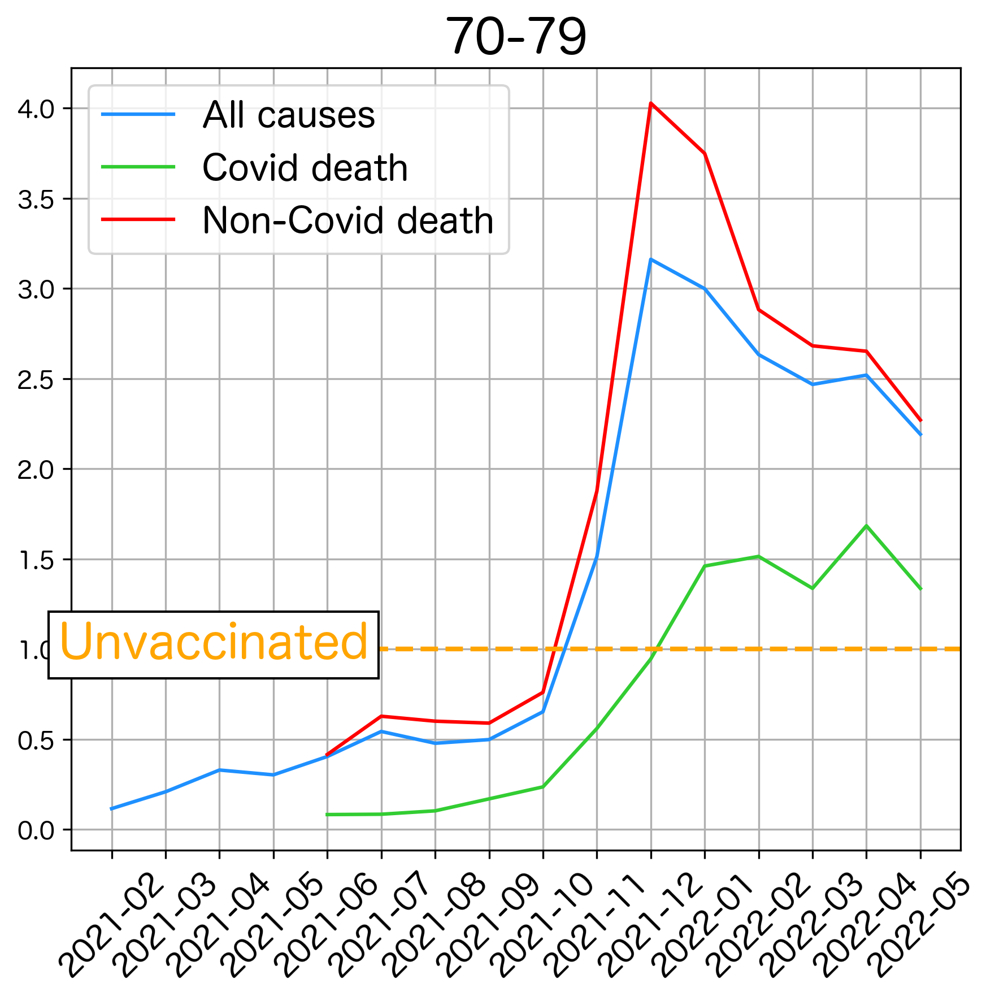

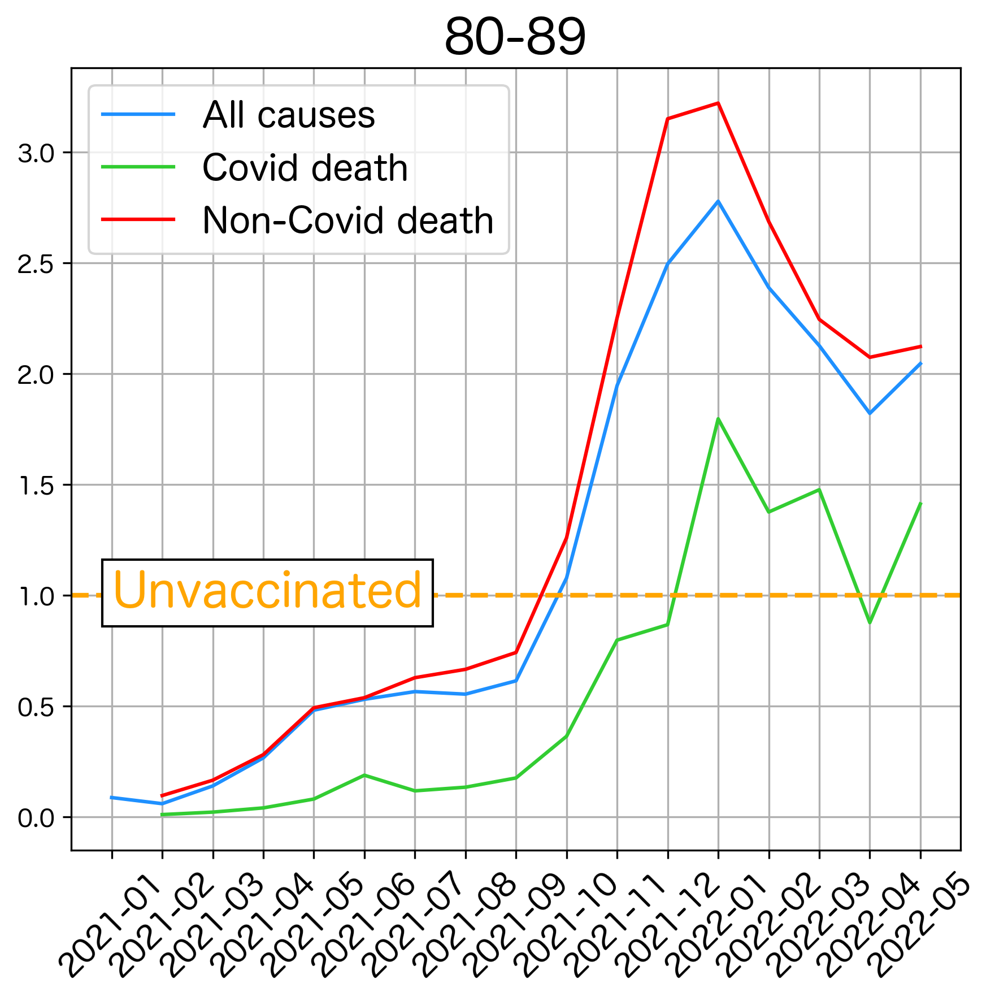

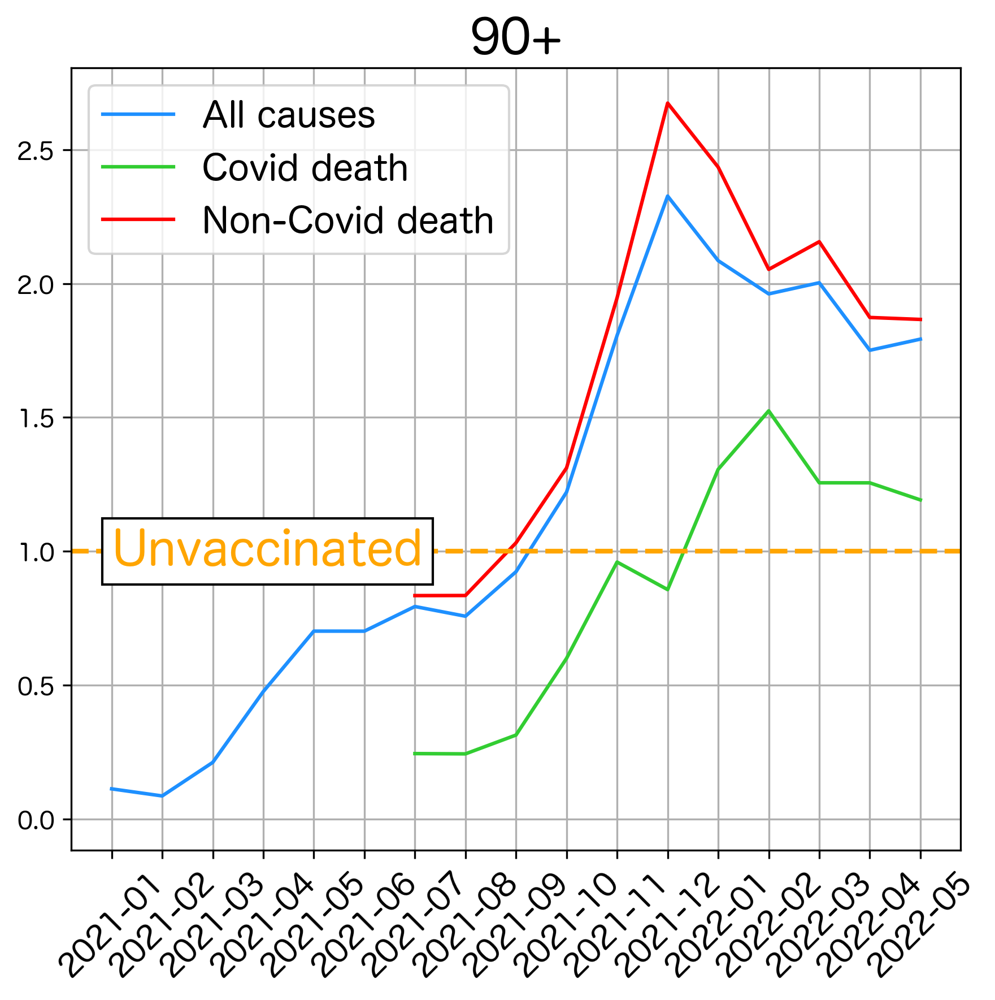

In [225]:
AgeGroup_lst = ['18-39','40-49', '50-59', '60-69', '70-79', '80-89', '90+']
import copy
import os

fig_size = (6,6)
save_path = 'results/England_Death_EN202205/3-causes-2doses'
os.makedirs(save_path,exist_ok=True)

v_status = 'Second dose, at least 21 days ago'
print('[Vax status: ', v_status, ']')

for AgeGroup in AgeGroup_lst[4:]:
    fig,ax=plt.subplots()
    #select_df = df[(df['Sex']==sex) & (df['Age group']==AgeGroup) & (df['Cause of Death']==CauseOfDeath)] #& (df['Date'] > '2021-09')]
    select_df0 = new_df[(new_df['Age group']==AgeGroup) & (new_df['Cause of Death']=='All causes')].reset_index(drop=True) #  & (df['Date'] > '2021-07')
    select_df1 = new_df[(new_df['Age group']==AgeGroup) & (new_df['Cause of Death']=='Deaths involving COVID-19')].reset_index(drop=True) #  & (df['Date'] > '2021-07')
    select_df = copy.deepcopy(select_df0)
    select_df['Morality_rate_per100K'] = select_df0['Morality_rate_per100K'] - select_df1['Morality_rate_per100K']
    #for v_status in vax_status_lst:
        
    # all cause
    risk_lst = select_df0[select_df0['Vaccination status']==v_status]['Morality_rate_per100K'].reset_index(drop=True) / select_df0[select_df0['Vaccination status']=='Unvaccinated']['Morality_rate_per100K'].reset_index(drop=True)
    plt_df = select_df0[select_df0['Vaccination status'] == 'Unvaccinated'][['Date']].reset_index(drop=True) #,'Morality_rate_per100K']].reset_index(drop=True)
    plt_df['xdose/unvax'] = risk_lst
    #plt.plot(plt_df['Date'],plt_df['xdose/unvax'])
    plt.plot(plt_df['Date'],plt_df['xdose/unvax'], color="dodgerblue")
    # covid death
    risk_lst = select_df1[select_df1['Vaccination status']==v_status]['Morality_rate_per100K'].reset_index(drop=True) / select_df1[select_df1['Vaccination status']=='Unvaccinated']['Morality_rate_per100K'].reset_index(drop=True)
    plt_df = select_df1[select_df1['Vaccination status'] == 'Unvaccinated'][['Date']].reset_index(drop=True) #,'Morality_rate_per100K']].reset_index(drop=True)
    plt_df['xdose/unvax'] = risk_lst
    #plt.plot(plt_df['Date'],plt_df['xdose/unvax'])
    plt.plot(plt_df['Date'],plt_df['xdose/unvax'], color="limegreen")
    # non covid death
    risk_lst = select_df[select_df['Vaccination status']==v_status]['Morality_rate_per100K'].reset_index(drop=True) / select_df[select_df['Vaccination status']=='Unvaccinated']['Morality_rate_per100K'].reset_index(drop=True)
    plt_df = select_df[select_df['Vaccination status'] == 'Unvaccinated'][['Date']].reset_index(drop=True) #,'Morality_rate_per100K']].reset_index(drop=True)
    plt_df['xdose/unvax'] = risk_lst
    #plt.plot(plt_df['Date'],plt_df['xdose/unvax'])
    plt.plot(plt_df['Date'],plt_df['xdose/unvax'], color="red")
    ax.text(0,0.95,'Unvaccinated',color="orange",fontsize=20,bbox=dict(facecolor='white', edgecolor=None, alpha=1))
    plt.axhline(y=1.0, color="orange", linestyle="--",linewidth = 2)

    ax.tick_params(axis='x', labelrotation=45,labelsize=13)
    fig.set_dpi(300)
    fig.set_size_inches(fig_size)
    ax.legend(['All causes','Covid death','Non-Covid death'],prop={'size': 15})
    #plt.title('_'.join(['3 causes', AgeGroup,v_status]))
    plt.title(AgeGroup,fontsize=20)
    plt.grid()
    plt.tight_layout()
    filename = ' '.join(['【3-causes-Mortality-Rate】',AgeGroup, v_status])+str(fig_size)+'.png'
    fig.savefig(os.path.join(save_path,filename),facecolor='white', transparent=False)


